Attention mechanism 적용

# 라이브러리 불러오기

In [1]:
import tensorflow as tf     # 텐서플로우를 tf 약칭으로 불러온다.
# tensorflow.keras.layers() -> tf.keras.layer()

from tensorflow import keras
from tensorflow.keras.layers import *
# tensorflow.keras.layers() -> keras.layers()

from tensorflow.keras import layers
# keras.layers() -> layers()

#As a result, tensorflow.keras.layers() -> layers()

# 그래프 그리는 라이브러리
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# 데이터 프레임, 데이터 처리 라이브러리
import pandas as pd

# 수식 계산, 행렬 처리에 유능함
import numpy as np

# 학습 및 평가 라이브러리
from sklearn.linear_model import Perceptron
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
import pickle
import joblib

# 통계 라이브러리 (정규분포 등)
from scipy.stats import uniform

# 시간 라이브러리
import time

# 현재 시간 입력
from datetime import date
today = date.today()

import os

Font_Title = {"fontsize" : 24}
Font_Xlabel = {"fontsize" : 14}
Font_Ylabel = {"fontsize" : 14}

In [2]:
def CreateFolder(directory):
    try:
        if not os.path.exists(directory):
            os.makedirs(directory)
    except OSError:
        print ('Error: Creating directory. ' +  directory)


def LoadFile(file_path, file_name, file_type='csv', index = False):
    if file_type == 'csv':
        file_load = pd.read_csv("{}/{}.csv".format(file_path, file_name), # encoding='euc-kr'
                                header = 0) 
        print(f"Dataset is loaded from: {file_path}/{file_name}.csv")
        print(f"Dataset shape: {file_load.shape}") 

    elif file_type == 'pkl':
        file_load = joblib.load(file_path + "/" + file_name + ".pkl")
        print("Scaler is loaded from: {}/{}.pkl".format(file_path, file_name))

    elif file_type == 'model':
        file_load = keras.models.load_model(f"{file_path}/{file_name}")
        print(f"Model is loaded from: {file_path}/{file_name}")
        
    return file_load


def SaveFile(file_save, file_path, file_name, file_type='csv'):
    if file_type == 'csv':
        file_save.to_csv(file_path + "/" + file_name +".csv", index = False)
        print("Data is saved to: {}/{}.csv".format(file_path, file_name))
        print("Data shape: {}".format(file_save.shape))

    elif file_type == 'pkl':
        joblib.dump(file_save, file_path + "/" + file_name + ".pkl")
        print("Scaler is saved to: {}/{}.pkl".format(file_path, file_name))


def FileExist(file_path, file_name, file_type='csv'):
    if file_type == "csv":
        IsTrue = os.path.exists(file_path + "/" + file_name + ".csv")

    elif file_type == "pkl":
        IsTrue = os.path.exists(file_path + "/" + file_name + ".pkl")

    elif file_type == 'model':
        IsTrue = os.path.exists(f"{file_path}/{file_name}")

    return IsTrue

# 드라이브 마운트

In [3]:
#4/1AY0e-g5Yzt3fzAVQ_KxWbJ4PNu9zdCMWgLVRlMjXTgmQqaWSIwfguwTZXBE

from google.colab import drive
drive.mount('/content/gdrive')

Path_Project = "/content/gdrive/My Drive/Colab Notebooks/DC"
Path_Data = Path_Project + "/Data"
Path_Modeling = Path_Project + "/Modeling"
Path_Graph = Path_Project + "/Graph"

CreateFolder(Path_Data)
CreateFolder(Path_Modeling)
CreateFolder(Path_Graph)

Mounted at /content/gdrive


# 모델링 변수 선정

In [4]:
Var_Mani = ["FT-3061-2", "FT-3061-3", "FT-3061-4", "FT-3062-1"]
              #FD RATE     #STM RATE    #RFLX RATE  #BTM FLOWRATE 
Var_Stat = ["TT-3061-1", "PT-3061-2", "TT-3061-2", "LT-3062-1", "TT-3061-4", "TT-3061-6", "PT-3061-3"]
             #FD TEMP      #TOP P      #TOP TEMP   #RFLX LVL     #MDL2 TEMP   #BTM TEMP    #BTM P

Var_Sens = ["TT-3061-3", "TT-3061-5", "LT-3061-2"]
              #MDL TEMP   #MDL-H TEMP  #LVL DGR  
# Var_Sens = ["TT-3061-3"]
Var_Qual = ["Acetoin"]              #Quality variables


Var_Total = Var_Mani + Var_Stat + Var_Sens
Var_Proc = Var_Mani + Var_Sens     #Process variables  

Num_Mani = len(Var_Mani)
# Num_Stat = len(Var_Stat)
Num_Sens = len(Var_Sens)

Num_Proc = len(Var_Proc)

Random_State = 10

In [5]:
Patience = 40
Early_stopping_cb = keras.callbacks.EarlyStopping(patience=Patience, restore_best_weights= True, monitor='val_loss')

Size_batch = 128

Num_layers = 1
Num_neurons = 25

# 데이터 불러오기

In [6]:
Name_Raw_Plant = "BDO Data Operation October"
Data_Raw_Plant = LoadFile(Path_Data, Name_Raw_Plant, 'csv')

Data_Raw_Plant.head()

Dataset is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Data/BDO Data Operation October.csv
Dataset shape: (83701, 63)


,Year,Month,Day,Hour,Minute,FT-3053-2,LT-3061-1,TT-3061-1,P-3061,LT-3061-2,LT-3062-1,PT-3061-2,PT-3061-3,DPI-3061,PT-3062-1,FT-3061-2,FT-3061-3,FT-3061-4,FT-3062-1,TT-3061-1.1,TT-3061-2,TT-3061-5,TT-3061-3,TT-3061-4,TT-3061-6,TT-3062-7,TT-3062-1,FCV-3061-2,FCV-3061-3,FCV-3061-4,LCV-3061-2,LCV-3062-1,PCV-3061-2,P-3062,P-3063,P-3065,P-3066,P-3064,AG-3065,LT-3062-2,LT-3063,LT-3065,PT-3062-2,PT-3062-3,DPI-3062,PT-3063,FT-3062,FT-3063,FT-3064,FT-3065,TT-3062-2,TT-3062-5,TT-3062-3,TT-3062-4,TT-3062-6,TT-3063,TT-3065,TT-3065-1,FCV-3062,FCV-3064,LCV-3063,LCV-3065,PCV-3062-2
0,2020,10,22,0,0,200.0,67.3,53.6,1.0,84.7,27.3,-0.966,-0.837,0.121,-0.968,0.0,144.8,62.0,0.0,53.6,38.6,39.1,38.4,72.1,61.8,34.8,30.8,0.0,35.0,62.9,0.0,0.3,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.036,-0.035,0.000,-0.035,0.0,0.0,0.0,0.0,16.6,35.4,36.0,29.9,30.2,18.0,16.7,22.9,0.0,0.0,0.0,0.0,0.0
1,2020,10,22,0,1,200.0,67.4,53.5,1.0,84.5,27.3,-0.966,-0.839,0.123,-0.969,0.0,151.2,60.4,0.0,53.5,38.6,39.0,38.3,72.6,62.4,34.9,30.8,0.0,35.0,62.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.035,-0.037,0.000,-0.035,0.0,0.0,0.0,0.0,16.6,35.3,36.0,29.9,30.2,18.0,16.6,22.8,0.0,0.0,0.0,0.0,0.0
2,2020,10,22,0,2,200.0,67.5,53.5,1.0,84.1,27.2,-0.966,-0.839,0.122,-0.969,0.0,145.4,58.6,0.0,53.5,38.5,38.9,38.1,73.2,62.8,34.9,30.7,0.0,35.0,62.6,0.0,0.2,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.036,-0.036,0.001,-0.035,0.0,0.0,0.0,0.0,16.6,35.3,35.9,29.8,30.2,18.0,16.6,22.8,0.0,0.0,0.0,0.0,0.0
3,2020,10,22,0,3,200.0,67.7,53.5,1.0,84.4,27.4,-0.968,-0.838,0.121,-0.969,0.0,147.2,59.6,0.0,53.5,38.4,38.7,37.9,74.1,63.4,34.9,30.8,0.0,35.0,63.8,0.0,0.2,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.035,-0.035,0.000,-0.035,6.7,0.0,0.0,0.0,16.6,35.3,35.9,29.8,30.1,18.0,16.6,22.8,0.0,0.0,0.0,0.0,0.0
4,2020,10,22,0,4,200.0,67.9,53.5,1.0,84.5,27.3,-0.968,-0.839,0.124,-0.970,0.0,150.4,61.0,0.0,53.5,38.4,38.6,37.7,75.1,63.9,34.9,30.7,0.0,35.0,63.3,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.036,-0.036,0.000,-0.036,0.0,0.0,0.0,0.0,16.5,35.2,35.8,29.8,30.1,18.0,16.6,22.8,0.0,0.0,0.0,0.0,0.0


In [7]:
data_target = Data_Raw_Plant[Var_Total]

Num_null = data_target.isnull().sum().sum()
print(f"Total number of null value is {Num_null}")
Data_null = data_target.fillna(0)     #결측치에 0 대입

Data_Plant = Data_null

Total number of null value is 392


#데이터 전처리

In [8]:
from sklearn.cluster import KMeans
from collections import Counter

def KmeanTest(data, num_test = 10):
    num_clusters = list(range(1,num_test))
    inertia_list = []
    for i in num_clusters:
        model = KMeans(n_clusters=i)
        model.fit(data)
        inertia_list.append(model.inertia_)
    
    plt.figure(figsize=(12,6))
    plt.plot(num_clusters, inertia_list, 'bo-')
    plt.xlabel("Number of Clusters(k)", fontdict=Font_xlabel)
    plt.ylabel("Inertia", fontdict=Font_ylabel)

def KmeanCluster(data, num_cluster, target_columns=False, colors=False, random_state=False):
    data_copy = data.copy()

    if target_columns:
        data_target = data_copy[target_columns]
    else:
        data_target = data_copy

    mean_data = data_target.mean(axis=0)
    std_data = data_target.std(axis=0)
    data_sc = (data_target - mean_data)/std_data

    model_cluster = KMeans(n_clusters = num_cluster, random_state=random_state)
    model_cluster.fit(data_sc)

    column_labels = model_cluster.labels_
    data_copy['Cluster'] = column_labels

    count_cluster = Counter(column_labels)
    count_sort = sorted(count_cluster.items(), reverse = True, key = lambda x: x[1])
    cluster_sorted = [x[0] for x in count_sort]
    

    color_list = ["blue", "forestgreen", "red", "gray", "orange", "brown", "lightcoral", "darkkhaki", "ivory"]
    if colors:
        color_list = colors

    column_color = []

    for row in data_copy['Cluster']:
        for i, cluster in enumerate(cluster_sorted):
            if row == cluster:
                column_color.append(color_list[i])
    
    data_copy['Color'] = column_color
    
    return data_copy, model_cluster

def KmeanPlot(data_clust, variables=False, figsize=6):
    data_copy = data_clust.copy()
    num_plot = len(data_copy.columns)

    if variables:
        num_plot = len(variables)
        data_copy = data_copy[variables]

    plt.rcParams['axes.facecolor'] = 'w'

    color_list = data_copy['Color'].unique()

    plot_var = data_copy.columns[:-2]
    plt.figure(figsize=(figsize*len(plot_var), figsize))
    for i, var in enumerate(plot_var):
        plt.subplot(1, len(plot_var), i+1)
        for j, color in enumerate(color_list):
            data_plot = data_copy.loc[ data_copy['Color'] == color]
            plt.scatter(data_plot.index, data_plot[var], color = color, s = 10, alpha = 0.8)
        
        plt.title(var, fontdict = Font_Title)
        plt.grid(True, color = 'gray', linestyle='--', alpha = 0.5)
    
    # plt.tight_layout()

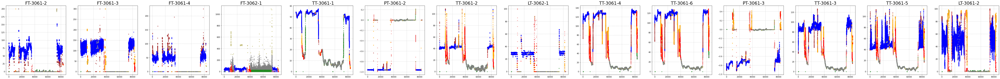

In [9]:
target_data = Data_Plant
Num_Cluster_Plant = 8

n_cluster = Num_Cluster_Plant

data_clust, _ = KmeanCluster(target_data, num_cluster=n_cluster, random_state=Random_State)
KmeanPlot(data_clust, figsize=7)

In [10]:
Data_Plant_Clust = data_clust.loc[data_clust['Color']=='blue']

In [11]:
# Remove 0 data

target_data = Data_Plant_Clust
target_var = Var_Proc

# filter data larger than value 0
df_domain = target_data[(target_data[target_var] > 0).all(axis=1)]

df_domain

,FT-3061-2,FT-3061-3,FT-3061-4,FT-3062-1,TT-3061-1,PT-3061-2,TT-3061-2,LT-3062-1,TT-3061-4,TT-3061-6,PT-3061-3,TT-3061-3,TT-3061-5,LT-3061-2,Cluster,Color
285,71.8,96.6,39.2,31.5,54.0,-0.962,39.9,29.9,126.3,114.3,-0.781,96.5,44.1,77.5,7,blue
286,70.8,115.9,41.0,46.5,54.0,-0.963,39.9,30.0,126.0,113.9,-0.783,96.4,44.1,77.6,7,blue
287,70.3,110.5,39.2,30.5,54.0,-0.963,39.8,30.1,126.0,113.8,-0.773,96.1,44.4,77.9,7,blue
288,69.6,97.8,38.7,32.6,53.9,-0.961,39.8,30.0,125.8,113.7,-0.782,95.9,44.5,78.2,7,blue
289,69.8,118.3,40.8,28.7,53.9,-0.961,39.8,30.1,125.8,113.6,-0.779,96.0,44.7,78.3,7,blue
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82325,76.9,120.1,80.4,39.5,21.6,-0.952,44.7,29.0,133.8,124.9,-0.646,96.8,97.8,58.8,7,blue
82326,80.0,138.2,72.1,40.7,21.4,-0.968,43.2,29.0,133.9,125.1,-0.668,97.5,97.9,59.1,7,blue
82327,80.8,125.6,98.8,40.7,18.9,-0.956,44.5,29.0,133.7,125.1,-0.671,98.4,99.9,58.2,7,blue
82338,61.8,128.2,101.5,41.0,15.7,-0.959,43.9,6.0,132.9,124.2,-0.697,97.1,88.1,42.5,7,blue


## 연속 데이터 분류

In [12]:
def ContsDatasets(data, min_length = 50):
    data_copy = data.copy()

    range_cts_list = []

    for i in range(len(data_copy)):
        if not i:
            index_start = data_copy.index[i]
            index_check = index_start
            index_check += 1

        elif index_check == data_copy.index[i]:
            index_check += 1

        else:
            index_end = data_copy.index[i-1]
            if index_end - index_start > min_length:
                range_cts_list.append(range(index_start, index_end))
            index_start = data_copy.index[i]
            index_check = index_start
            index_check += 1
    print(range_cts_list)
    data_cts_list = []

    for range_cts in range_cts_list:
        data_cts_list.append(data_copy.loc[range_cts])

    return data_cts_list

In [13]:
Min_Series = 500
target_data = df_domain

data_cts = ContsDatasets(target_data, min_length = Min_Series)

len(data_cts)

[range(2041, 2589), range(2591, 3109), range(3111, 4455), range(4831, 6819), range(7151, 7726), range(8277, 9094), range(16426, 17521), range(17523, 18685), range(18696, 23131), range(26217, 26867), range(27637, 29436), range(29890, 33629), range(75800, 76957), range(78624, 80272), range(80610, 82184)]


15

# DATA PREPARATION

## Train/Test split

In [14]:
import random

def ListTrainTestSplitSemiRandom(data_list, test_ratio=0.2, seed=42):
    data_copy = data_list.copy()

    test_list=[]
    test_index = []
    min_max_list = []
    for i, var in enumerate(data_list[0].columns):
        for j, data in enumerate(data_list):
            min = data[var].min()
            max = data[var].max()

            if not j:
                global_min = min
                global_max = max

                index_min = j
                index_max = j

            elif global_min > min:
                global_min = min
                index_min = j

            elif global_max < max:
                global_max = max
                index_max = j

        min_max_list = min_max_list + [index_min, index_max]

    except_list = list(set(min_max_list))        
     
    while(len(test_index) <= int(len(data_copy)*test_ratio)):
        random.seed(seed)
        num = random.randint(0, len(data_copy)-1)
        if (num not in test_index) and (num not in except_list):
            test_index.append(num)
        seed += 1
    test_index = sorted(test_index, reverse=True)
    
    print(f"Train {len(data_copy)-len(test_index)} Test {len(test_index)}")
    print(f"Test Index: {test_index}")

    for num_pop in test_index:
        test_list.append(data_copy.pop(num_pop))

    return data_copy, test_list


def EvenTTSplit(data, split_ratio):

    test_num = int(len(data)/100*0.2)
    test_index = [x for x in range(0, int(len(data)/100 ), int(len(data)/100/test_num))]

    test = []
    train = []

    for start in range(int(len(data)/100)):

        temp = data[start*100:start*100+100]

        if start in test_index:
            if start == test_index[0]:
                test = temp
            else:
                test = np.concatenate([test, temp ])

        else:
            if len(train) == 0:
                train = temp
            else:
                train = np.concatenate([train, temp])

    return train, test


In [15]:
# by random
Test_Ratio_Plant = 0.2

Data_Train, Data_Test = ListTrainTestSplitSemiRandom(data_cts, Test_Ratio_Plant)


Train 11 Test 4
Test Index: [10, 4, 3, 1]


## 시리즈 데이터 생성

In [16]:
def MSMOSeriesData(data_history, data_future, index_start, index_end, history_length, future_length, step):
    data = []
    labels = []

    index_start = index_start + history_length
    if index_end is None:
        index_end = len(data_history) - future_length

    for i in range(index_start, index_end):
        indices_x = range(i-history_length, i, step)
        data.append(data_history[indices_x])

        if future_length == 1:
            labels.append(data_future[i])
        else:
            labels.append(data_future[i : i+future_length : step])

    return np.array(data), np.array(labels)

def MakeSeries(data_target, Len_Hist, Len_Futr, Step):
    for i, data_sc in enumerate(data_target):
        history_data_sc, future_data_sc = MSMOSeriesData(data_sc[Var_Proc].values, data_sc[Var_Sens].values,
                                                        0, None,
                                                        Len_Hist, Len_Futr, Step)
        if not i:
            Hist_sc = history_data_sc
            Futr_sc = future_data_sc
            
        else:
            Hist_sc = np.concatenate([Hist_sc, history_data_sc], axis=0)
            Futr_sc = np.concatenate([Futr_sc, future_data_sc], axis=0)
    
    return Hist_sc, Futr_sc

In [17]:
Step = 1
Len_Hist = 80
Len_Futr = 50

In [18]:
Hist_Train, Futr_Train = MakeSeries(Data_Train, Len_Hist, Len_Futr, Step)
Hist_Test, Futr_Test = MakeSeries(Data_Test, Len_Hist, Len_Futr, Step)

print ("(the Number of Dataset, Length of History, Features of History)",
    f"History Train: {Hist_Train.shape}",
    f"Future Train: {Futr_Train.shape}",
    f"History Test: {Hist_Test.shape}",
    f"Future Test: {Futr_Test.shape}",
    sep='\n')

(the Number of Dataset, Length of History, Features of History)
History Train: (16739, 80, 7)
Future Train: (16739, 50, 3)
History Test: (4360, 80, 7)
Future Test: (4360, 50, 3)


## 데이터 가중치

In [19]:
def FactorCalculate(delta, time_step_y, num_y, type):

    if type == 'linear':
        if delta == 1:
            # factor = np.array([np.arange(delta+1,1-delta/time_step_y,-delta/time_step_y)*(i+1)/(i+1) for i in range(num_y)]).T
            factor = np.array([np.arange(delta+1, 1, -delta/time_step_y)*(i+1)/(i+1) for i in range(num_y)]).T
        else:
            factor = np.array([np.arange(delta+1, 0.999, -delta/(time_step_y-1))*(i+1)/(i+1) for i in range(num_y)]).T

    elif type == 'reverse':
        if delta == 3:
            # factor = np.array([np.arange(delta+1,1-delta/time_step_y,-delta/time_step_y)*(i+1)/(i+1) for i in range(num_y)]).T
            factor = np.array([np.arange(1, delta+1, delta/time_step_y)*(i+1)/(i+1) for i in range(num_y)]).T

    elif type == 'exp':
        x = np.arange(0,time_step_y)
        y = (1+delta)**((time_step_y-1-x)/(time_step_y-1))

        factor = np.array([y*(i+1)/(i+1) for i in range(num_y)]).T

    else:
        print("Invalid Delta")
        factor = False
        
    return factor

In [20]:
# # factor = np.array([np.arange(10,0.75,-1)*(i+1)/(i+1) for i in range(3)]).T
Delta = 1.5
factor = FactorCalculate(Delta, Len_Futr, Num_Sens, 'linear')

Futr_Train_wght = Futr_Train * factor
Futr_Test_wght = Futr_Test * factor

factor

array([[2.5       , 2.5       , 2.5       ],
       [2.46938776, 2.46938776, 2.46938776],
       [2.43877551, 2.43877551, 2.43877551],
       [2.40816327, 2.40816327, 2.40816327],
       [2.37755102, 2.37755102, 2.37755102],
       [2.34693878, 2.34693878, 2.34693878],
       [2.31632653, 2.31632653, 2.31632653],
       [2.28571429, 2.28571429, 2.28571429],
       [2.25510204, 2.25510204, 2.25510204],
       [2.2244898 , 2.2244898 , 2.2244898 ],
       [2.19387755, 2.19387755, 2.19387755],
       [2.16326531, 2.16326531, 2.16326531],
       [2.13265306, 2.13265306, 2.13265306],
       [2.10204082, 2.10204082, 2.10204082],
       [2.07142857, 2.07142857, 2.07142857],
       [2.04081633, 2.04081633, 2.04081633],
       [2.01020408, 2.01020408, 2.01020408],
       [1.97959184, 1.97959184, 1.97959184],
       [1.94897959, 1.94897959, 1.94897959],
       [1.91836735, 1.91836735, 1.91836735],
       [1.8877551 , 1.8877551 , 1.8877551 ],
       [1.85714286, 1.85714286, 1.85714286],
       [1.

## Scaling

원본 데이터 스케일링

In [25]:
data_target = Hist_Train

mean_data = data_target.mean(axis=0).mean(axis=0)
std_data = data_target[:,0,:].std(axis=0)

Mean_Proc = mean_data
Std_Proc = std_data

print(f"MEAN:\n{Mean_Proc}")
print()
print(f"STD:\n{Std_Proc}")

Hist_Train_sc = (Hist_Train - Mean_Proc)/Std_Proc
Hist_Test_sc = (Hist_Test - Mean_Proc)/Std_Proc

Futr_Train_sc = (Futr_Train - Mean_Proc[-3:])/Std_Proc[-3:]
Futr_Test_sc = (Futr_Test - Mean_Proc[-3:])/Std_Proc[-3:]

MEAN:
[ 70.97586415 123.89390712  49.02814751  44.3530072   90.60937728
  47.35590208  47.78632042]

STD:
[11.38639527 16.72691283  6.21848352  8.98513799  5.94441954  7.36217445
  9.23304979]


가중치 데이터 스케일링

In [26]:
data_target = Hist_Train

mean_mani = data_target[:,0,:Num_Mani].mean(axis=0)
std_mani = data_target[:,0,:Num_Mani].std(axis=0)

mean_sens = Futr_Train_wght.mean(axis=0).mean(axis=0)
std_sens = Futr_Train_wght[:,0,:].std(axis=0)

Mean_Proc_wght = np.concatenate([mean_mani,mean_sens])
Std_Proc_wght = np.concatenate([std_mani, std_sens ])

print(f"MEAN:\n{Mean_Proc_wght}")
print()
print(f"STD:\n{Std_Proc_wght}")

Hist_Train_wght_sc = (Hist_Train - Mean_Proc_wght)/Std_Proc_wght
Hist_Test_wght_sc = (Hist_Test - Mean_Proc_wght)/Std_Proc_wght

Futr_Train_wght_sc = (Futr_Train_wght - Mean_Proc_wght[-3:])/Std_Proc_wght[-3:]
Futr_Test_wght_sc = (Futr_Test_wght - Mean_Proc_wght[-3:])/Std_Proc_wght[-3:]

MEAN:
[ 70.84508035 123.88091284  49.17331979  44.28791445 158.53604882
  82.91429816  83.4978821 ]

STD:
[11.38639527 16.72691283  6.21848352  8.98513799 14.56411021 17.51795568
 23.21351512]


# MODELING

Attention 참고사이트

1. https://levelup.gitconnected.com/building-seq2seq-lstm-with-luong-attention-in-keras-for-time-series-forecasting-1ee00958decb


2. https://wikidocs.net/22893

In [21]:
def R_Squared(prediction, actual):    
    actual_mean = np.mean(actual, axis=0)
    SSR = np.sum( (prediction - actual)**2 , axis=0)    
    RSS = np.sum( (prediction - actual_mean )**2, axis=0 )
    TSS = np.sum( (actual - actual_mean )**2, axis=0 )    
    
    R_square = 1 - SSR/TSS
    return R_square
                          
def RMSE(prediction, actual):
    rmse = np.sqrt(np.mean((prediction - actual)**2, axis=0))
    return rmse

def nRMSE(prediction, actual):
    rmse = np.sqrt(np.mean((prediction - actual)**2, axis=0))
    min_hat = np.min(np.min(actual, axis = 0), axis=0)
    max_hat = np.max(np.max(actual, axis = 0), axis=0)
    nrmse = rmse/(max_hat - min_hat) *100
    return nrmse

In [22]:
import random
import numpy as np
import matplotlib.pyplot as plt

import pickle as pkl
from tensorflow import keras
from keras.models import Sequential, Model, load_model
from keras.layers import LSTM, Dense, RepeatVector, TimeDistributed, Input, BatchNormalization, multiply, concatenate, Flatten, Activation, dot  
# from keras.optimizers import Adam
# from keras.utils import plot_model
from keras.callbacks import EarlyStopping
import pydot as pyd
from keras.utils.vis_utils import plot_model, model_to_dot

def TC_LSTM_rev(x_input, y_output,num_layers, num_neurons, dnn_neurons=False):
    input = Input(shape=(x_input.shape[1], x_input.shape[2]))
    output = Input(shape=(y_output.shape[1], y_output.shape[2]))

    if num_layers == 1:
        hidden_state_en = input

    else:
         #인코더 은닉층
        for layer in range(num_layers-1):
            if layer == 0:
                hidden_state_en = GRU(num_neurons, 
                                    return_sequences=True,
                                    return_state=False)(input)
            else:
                hidden_state_en = GRU(num_neurons, 
                                    return_sequences=True,
                                    return_state=False)(hidden_state_en)

    encoder_last_h1, encoder_last_c = GRU(num_neurons, 
                                                            return_sequences=False,
                                                            return_state=True)(hidden_state_en)

    decoder_input = RepeatVector(output.shape[1])(encoder_last_h1)

    if num_layers == 1:
        hidden_state_de = decoder_input

    else:
        #디코더 은닉층
        for layer in range(num_layers-1):
            if layer == 0:
                hidden_state_de = GRU(num_neurons, 
                                    return_sequences=True,
                                    return_state=False)(decoder_input)
            else:
                hidden_state_de = GRU(num_neurons, 
                                    return_sequences=True,
                                    return_state=False)(hidden_state_de)

    decoder = GRU(num_neurons,
                   return_sequences = True,
                   return_state=False)(hidden_state_de)  #, initial_state=[encoder_last_h1,encoder_last_c ])

    out = TimeDistributed(Dense(output.shape[2]))(decoder)

    if dnn_neurons:
        out = Dense(Len_Futr)(out)
        out = Dense(output.shape[2])(out)

    model = Model(inputs=input, outputs=out)

    optimizer = keras.optimizers.Adam(learning_rate = 0.001, beta_1=0.9, beta_2=0.999)
    model.compile(loss='mse',
                  optimizer = optimizer)

    return model

def ATT_TC_LSTM(x_input, y_output, num_layers, num_neurons, dnn_neurons=False):
    input = Input(shape=(x_input.shape[1], x_input.shape[2]))
    output = Input(shape=(y_output.shape[1], y_output.shape[2]))

    if num_layers == 1:
        hidden_state_en = input

    else:
        #인코더 은닉층
        for layer in range(num_layers-1):
            if layer == 0:
                hidden_state_en = GRU(num_neurons, 
                                    return_sequences=True,
                                    return_state=False)(input)
            else:
                hidden_state_en = GRU(num_neurons, 
                                    return_sequences=True,
                                    return_state=False)(hidden_state_en)

    encoder_stack_h, encoder_last_h = GRU(num_neurons, 
                                                        return_sequences=True,
                                                        return_state=True)(hidden_state_en)

    decoder_input = RepeatVector(output.shape[1])(encoder_last_h)

    if num_layers == 1:
        hidden_state_de = decoder_input

    else:
        #디코더 은닉층
        for layer in range(num_layers-1):
            if layer == 0:
                hidden_state_de = GRU(num_neurons, 
                                    return_sequences=True,
                                    return_state=False)(decoder_input)
            else:
                hidden_state_de = GRU(num_neurons, 
                                    return_sequences=True,
                                    return_state=False)(hidden_state_de)

    decoder_stack_h = GRU(num_neurons,              # Alignment score 계산을 위한 디코더 누적 히든상태 반환
                       return_state=False,
                       return_sequences=True)(hidden_state_de)   #, initial_state=[encoder_last_h, encoder_last_c])

    # 어텐션 층 
    attention = dot([decoder_stack_h, encoder_stack_h], axes=[2,2])
    attention = Activation('softmax', name = 'attention_vec')(attention)            # Alignment score 계산
    context = dot([attention, encoder_stack_h],axes=[2,1])
    decoder_conbined_context = concatenate([context, decoder_stack_h])

    out = TimeDistributed(Dense(output.shape[2]))(decoder_conbined_context)

    if dnn_neurons:
        out = Dense(Len_Futr)(out)
        out = Dense(output.shape[2])(out)

        out = tf.keras.layers.Multiply()([out, factor.reshape(-1,Len_Futr,3)])

    model = Model(inputs=input, outputs=out)
    optimizer = keras.optimizers.Adam(learning_rate = 0.001, beta_1=0.9, beta_2=0.999)
    model.compile(loss='mse',
                  optimizer = optimizer)

    return model

## CASE 1 : Original Prediction

Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 40 200 TT-3061-3 0 BASE
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 40 200 TT-3061-5 0 BASE
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 40 200 LT-3061-2 0 BASE


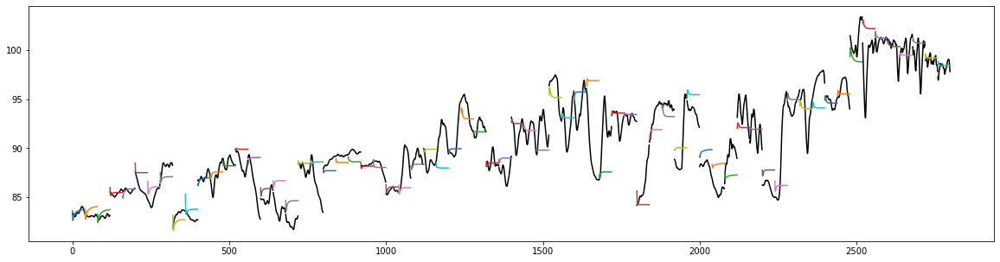

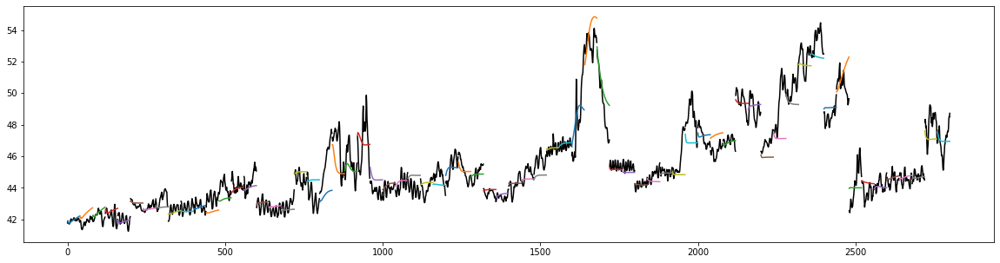

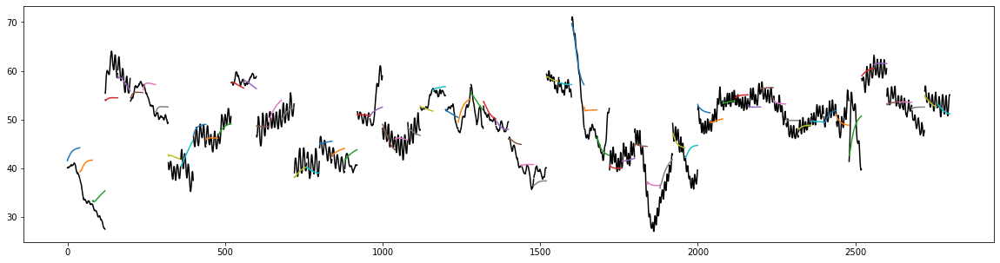

In [ ]:
Model_test_number = 0

for var_index, var in enumerate(Var_Sens):

    Name_model_DWGHT = f"{Name_Data_EWA} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} {Num_neurons} {var} {Model_test_number} BASE"

    Update = False
    if not FileExist(Path_Modeling, f"{Name_model_DWGHT}", 'model') or Update:
        time_start = time.time()

        Model_DWGHT = TC_LSTM_rev(Hist_Train_sc[:, : , [0, 1, 2, 3, 4+var_index]],Futr_Train_sc[:, :, [var_index]],1, Num_neurons)
        print(Model_DWGHT.summary())
        history = Model_DWGHT.fit(Hist_Train_sc[:, : , [0, 1, 2, 3, 4+var_index]],Futr_Train_sc[:, :, [var_index]],
                                epochs = 10000, callbacks=[Early_stopping_cb],
                                verbose = 2, batch_size=Size_batch,
                                validation_data=(Hist_Test_sc[:, : , [0, 1, 2, 3, 4+var_index]], Futr_Test_sc[:, :, [var_index]]))
        Model_DWGHT.save(f'{Path_Modeling}/{Name_model_DWGHT}')

        time_end = time.time()
        Time_Training = time_end - time_start

        np.set_printoptions(precision=2)
        print(f"{Time_Training} secs were taken")
        CreateFolder(f"{Path_Modeling}/{Name_model_DWGHT}/{Time_Training} secs were taken")

    else:
        Model_DWGHT = LoadFile(Path_Modeling, f'{Name_model_DWGHT}', 'model')

    Predict_DW = Model_DWGHT.predict(Hist_Test_sc[:, : , [0, 1, 2, 3, 4+var_index]])* Std_Proc[4+var_index] + Mean_Proc[4+var_index]

    R2_DW = pd.DataFrame(R_Squared(Predict_DW, Futr_Test[:,:,[var_index]]))
    NRMSE_DW = pd.DataFrame(nRMSE(Predict_DW, Futr_Test[:,:,[var_index]]))

    R2_NRMSE = pd.concat([R2_DW, NRMSE_DW], axis=1)

    if var_index == 0:
        Results_DW = R2_NRMSE
    else:
        Results_DW = pd.concat([Results_DW, R2_NRMSE], axis = 1)

    data_target = Predict_DW
    plt.figure(figsize = (20,5))
    for i in range(0,data_target.shape[0], 40):
        plt.plot(np.arange(i, i+40), Futr_Test[i, :, var_index].flatten(), 'k')
        plt.plot(np.arange(i, i+40), data_target[i, :, :].flatten())

In [ ]:
Results_DW

,0,0,0,0,0,0
0,0.967914,3.790868,0.971963,3.455877,0.963443,3.163407
1,0.971792,3.554988,0.960608,4.101191,0.945794,3.858586
2,0.964646,3.979395,0.951388,4.562800,0.934440,4.250056
3,0.955286,4.473882,0.943868,4.910753,0.925860,4.525809
4,0.944802,4.968389,0.938298,5.156309,0.920975,4.678682
5,0.934167,5.422281,0.934225,5.329513,0.919048,4.742087
6,0.923822,5.828319,0.930619,5.479871,0.918395,4.769041
7,0.913971,6.189021,0.927023,5.625825,0.917337,4.809211
8,0.904669,6.510222,0.923168,5.779080,0.914837,4.891753
9,0.895885,6.798994,0.918748,5.951491,0.910687,5.020091


## CASE 2 : Attention Prediction

In [ ]:
Model_test_number = 0
Name_model_AT = f"{Name_Data_EWA} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} {Num_neurons}, {Model_test_number} ATT"

Update = False
if not FileExist(Path_Modeling, f"{Name_model_AT}", 'model') or Update:
    time_start = time.time()

    Model_AT = ATT_TC_LSTM(Hist_Train_sc, Futr_Train_sc, 1 ,Num_neurons)
    print(Model_AT.summary())
    history = Model_AT.fit(Hist_Train_sc, Futr_Train_sc,
                            epochs = 10000, callbacks=[Early_stopping_cb],
                            verbose = 2, batch_size=Size_batch,
                            validation_data=(Hist_Test_sc, Futr_Test_sc))
    Model_AT.save(f'{Path_Modeling}/{Name_model_AT}')

    time_end = time.time()
    Time_Training = time_end - time_start

    np.set_printoptions(precision=2)
    print(f"{Time_Training} secs were taken")
    CreateFolder(f"{Path_Modeling}/{Name_model_AT}/{Time_Training} secs were taken")

else:
    Model_AT = LoadFile(Path_Modeling, f'{Name_model_AT}', 'model')


Model_AT = Model(inputs=Model_AT.input, outputs=[Model_AT.output, Model_AT.get_layer('attention_vec').output])

Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.9 TS 0.2 HISTORY 60 FUTURE 30 1, 200 TC GRU 2 ATT


In [ ]:
Predict_AT, Weights_AT = Model_AT.predict(Hist_Test_sc)[0] * Std_Proc[-3:] + Mean_Proc[-3:], Model_AT.predict(Hist_Test_sc)[1]

R2_AT = pd.DataFrame(R_Squared(Predict_AT, Futr_Test))
NRMSE_AT = pd.DataFrame(nRMSE(Predict_AT, Futr_Test))

pd.concat([NRMSE_AT, R2_AT], axis=1)

,0,1,2,0,1,2
0,0.667768,0.314937,1.158770,0.990695,0.991363,0.985230
1,0.653437,0.333886,1.102687,0.991106,0.990293,0.986669
2,0.685374,0.382042,1.098454,0.990234,0.987291,0.986815
3,0.749915,0.429249,1.123522,0.988332,0.983955,0.986249
4,0.834436,0.470766,1.148042,0.985585,0.980700,0.985685
5,0.928157,0.506833,1.167791,0.982205,0.977629,0.985232
6,1.023877,0.538961,1.186911,0.978398,0.974709,0.984792
7,1.117353,0.568505,1.212730,0.974337,0.971871,0.984179
8,1.206253,0.596625,1.250534,0.970168,0.969031,0.983241
9,1.289498,0.623611,1.302099,0.965996,0.966178,0.981908


## CASE 3 : Weighted Attention Prediction

In [ ]:
Model_test_number = 0
Name_model_WAT = f"{Name_Data_EWA} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr}, DELTA {Delta} {Num_neurons}, {Model_test_number} WATT"

Update = False
if not FileExist(Path_Modeling, f"{Name_model_WAT}", 'model') or Update:
    time_start = time.time()

    Model_WAT = ATT_TC_LSTM(Hist_Train_wght_sc, Futr_Train_wght_sc, 1 ,Num_neurons, True)
    print(Model_WAT.summary())
    history = Model_WAT.fit(Hist_Train_wght_sc, Futr_Train_wght_sc,
                            epochs = 10000, callbacks=[Early_stopping_cb],
                            verbose = 2, batch_size=Size_batch,
                            validation_data=(Hist_Test_wght_sc, Futr_Test_wght_sc))
    Model_WAT.save(f'{Path_Modeling}/{Name_model_WAT}')

    time_end = time.time()
    Time_Training = time_end - time_start

    np.set_printoptions(precision=2)
    print(f"{Time_Training} secs were taken")
    CreateFolder(f"{Path_Modeling}/{Name_model_WAT}/{Time_Training} secs were taken")

else:
    Model_WAT = LoadFile(Path_Modeling, f'{Name_model_WAT}', 'model')

Model_WAT = Model(inputs=Model_WAT.input, outputs=[Model_WAT.output, Model_WAT.get_layer('attention_vec').output])

Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.9 TS 0.2 HISTORY 60 FUTURE 30 1, 200 TC GRU 1 WATT With DNN CLoss


In [ ]:
Predict_WAT, Weights_WAT = Model_WAT.predict(Hist_Test_wght_sc)[0]* Std_Proc_wght[-3:] + Mean_Proc_wght[-3:], Model_WAT.predict(Hist_Test_wght_sc)[1]

R2_WAT = pd.DataFrame(R_Squared(Predict_WAT/factor, Futr_Test))
NRMSE_WAT = pd.DataFrame(nRMSE(Predict_WAT/factor, Futr_Test))

pd.concat([NRMSE_WAT, R2_WAT], axis=1)

,0,1,2,0,1,2
0,0.569324,0.222600,0.673124,0.993237,0.995685,0.995016
1,0.505702,0.261487,0.757317,0.994673,0.994046,0.993712
2,0.543254,0.307956,0.865404,0.993864,0.991742,0.991816
3,0.606812,0.352355,0.959241,0.992360,0.989189,0.989976
4,0.685779,0.391799,1.029537,0.990264,0.986631,0.988487
5,0.772788,0.427430,1.080324,0.987664,0.984090,0.987361
6,0.863555,0.460447,1.121421,0.984633,0.981541,0.986424
7,0.954941,0.492242,1.164045,0.981255,0.978911,0.985423
8,1.044511,0.524131,1.215882,0.977631,0.976100,0.984157
9,1.130609,0.556281,1.279398,0.973860,0.973088,0.982533


# Attention Weights

In [ ]:
#전체 plot
# Att_Weights = Model_DWAT.predict(Hist_Test_sc)[1]

# xlabel = [f't-{x}' for x in range(Len_Hist, 0, -1)]
# ylabel = [f't+{x}' for x in range(Len_Futr)]

# # len(ylabel)
# for i in range(len(Att_Weights)):
#     att = Att_Weights[i]
#     plt.figure(figsize=(20,5))
#     plt.title(f'{i} sample attention weights')
#     ax = sns.heatmap(att, xticklabels=xlabel, yticklabels=ylabel, cmap='Blues')
#     plt.xlabel('History')
#     plt.ylabel('Future')
#     plt.show()

Text(159.0, 0.5, 'Future')

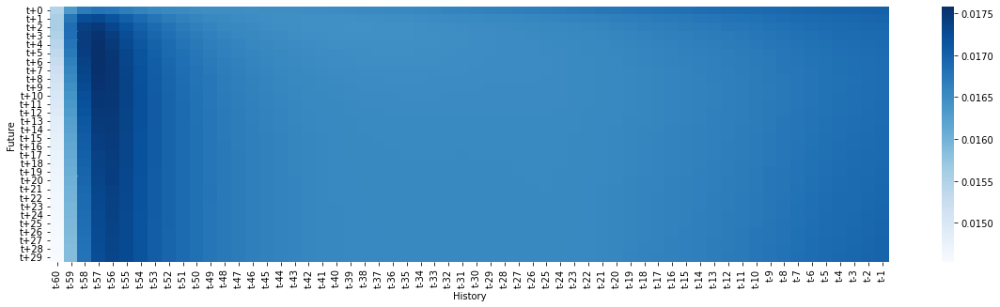

In [ ]:
# Case 2 attention weights
Avg_Weights_AT = Weights_AT.mean(axis=0)
Std_Weights_AT = Weights_AT.std(axis=0)

xlabel = [f't-{x}' for x in range(Len_Hist, 0, -1)]
ylabel = [f't+{x}' for x in range(Len_Futr)]

plt.figure(figsize=(20,5))
ax = sns.heatmap(Avg_Weights_AT, xticklabels=xlabel, yticklabels=ylabel, cmap='Blues')
plt.xlabel('History')
plt.ylabel('Future')


In [ ]:
Model_test_number = 1
Name_Data = f'{Name_Raw_Plant} CLS {Num_Cluster_Plant} SRS {Min_Series}'
Name_model_WAT = f"{Name_Data} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr}, DELTA {Delta} {Num_neurons}, {Model_test_number} WATT"

Update = False
if not FileExist(Path_Modeling, f"{Name_model_WAT}", 'model') or Update:
    time_start = time.time()

    Model_WAT = ATT_TC_LSTM(Hist_Train_wght_sc, Futr_Train_wght_sc, 1 ,Num_neurons, True)
    print(Model_WAT.summary())
    history = Model_WAT.fit(Hist_Train_wght_sc, Futr_Train_wght_sc,
                            epochs = 10000, callbacks=[Early_stopping_cb],
                            verbose = 2, batch_size=Size_batch,
                            validation_data=(Hist_Test_wght_sc, Futr_Test_wght_sc))
    Model_WAT.save(f'{Path_Modeling}/{Name_model_WAT}')

    time_end = time.time()
    Time_Training = time_end - time_start

    np.set_printoptions(precision=2)
    print(f"{Time_Training} secs were taken")
    CreateFolder(f"{Path_Modeling}/{Name_model_WAT}/{Time_Training} secs were taken")

else:
    Model_WAT = LoadFile(Path_Modeling, f'{Name_model_WAT}', 'model')


Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 1 WATT


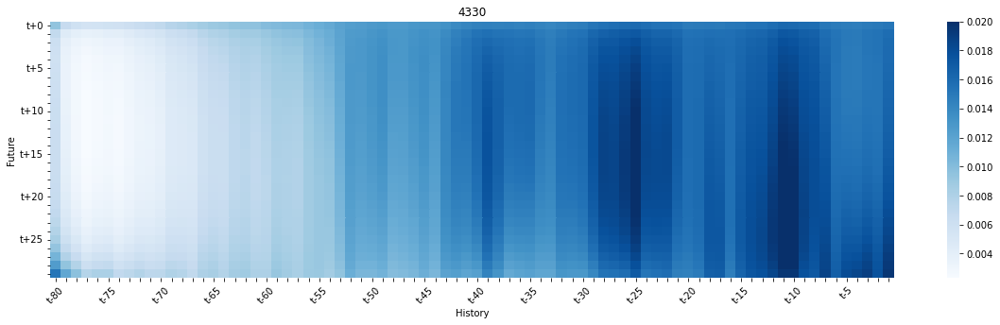

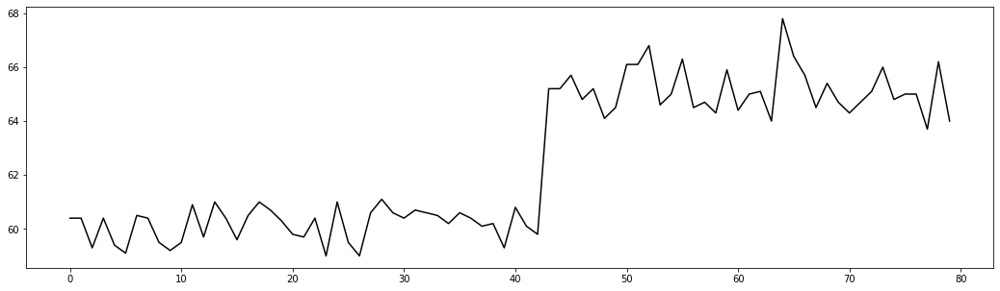

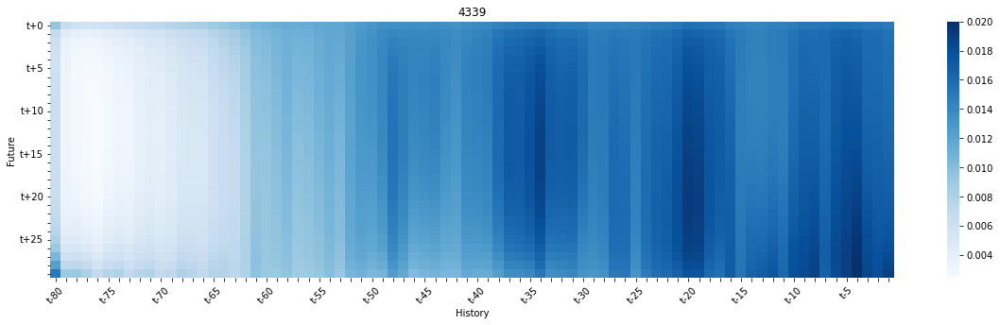

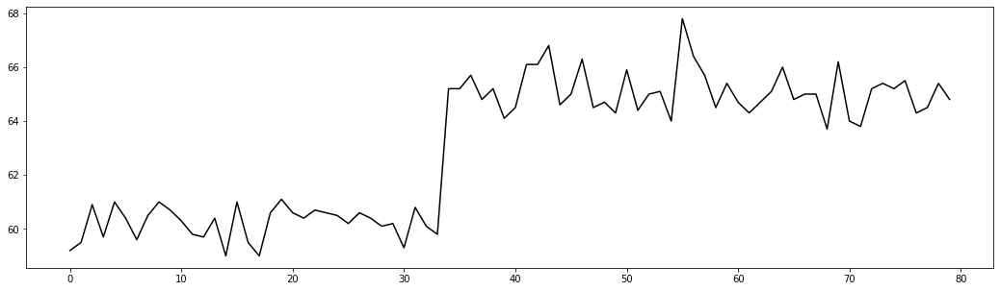

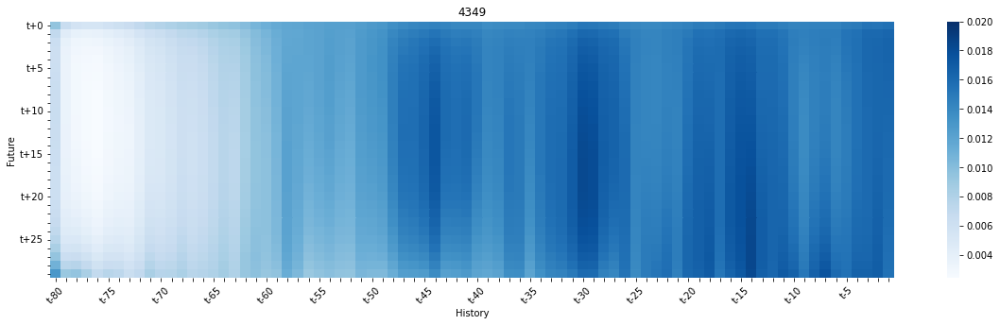

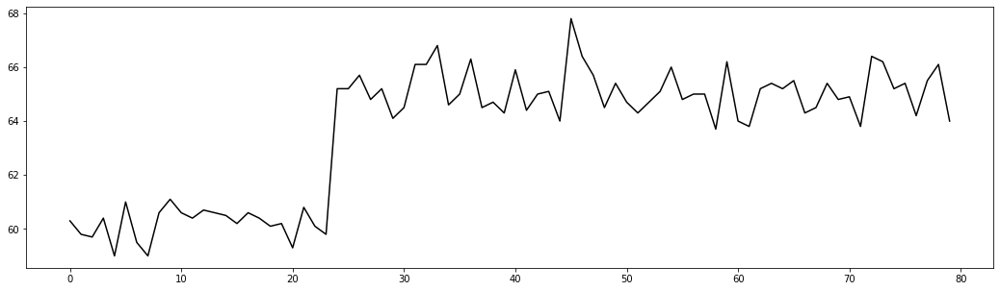

In [ ]:
Model_WAT = Model(inputs=Model_WAT.input, outputs=[Model_WAT.output, Model_WAT.get_layer('attention_vec').output])
Predict_WAT, Weights_WAT = Model_WAT.predict(Hist_Test_wght_sc)   #*Std_Proc_wght[-3:] + Mean_Proc_wght[-3:]

Figure_index = [4330,4339, 4349]

for i in Figure_index:
    xlabel = [f't-{x}' if x%5 == 0 else " " for x in range(Len_Hist, 0, -1)]
    ylabel = [f't+{x}' if x%5 == 0 else " " for x in range(Len_Futr)]

    plt.figure(figsize=(20,5))
    ax = sns.heatmap(Weights_WAT[i, :,:], xticklabels=xlabel, yticklabels=ylabel, cmap='Blues', vmax=0.02)
    plt.title(f'{i}')
    plt.xlabel('History')
    plt.ylabel('Future')
    plt.xticks(rotation=45)
    plt.show()

    plt.figure(figsize=(18,5))
    plt.plot(Hist_Train[i, :, 0], 'k')
    plt.show()


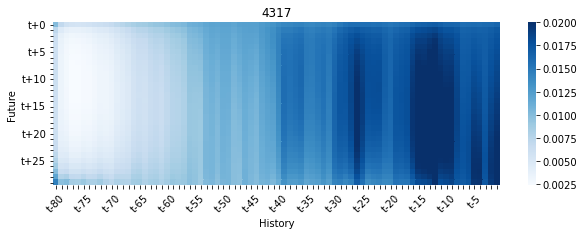

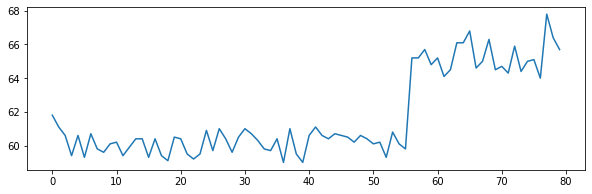

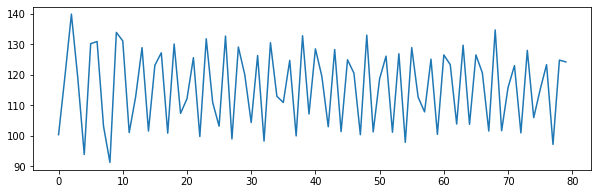

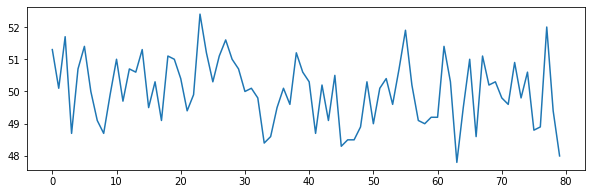

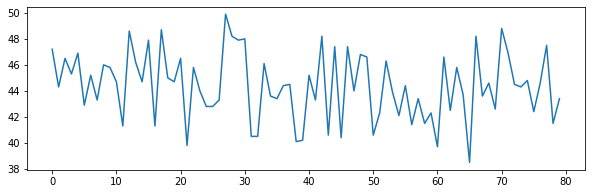

...

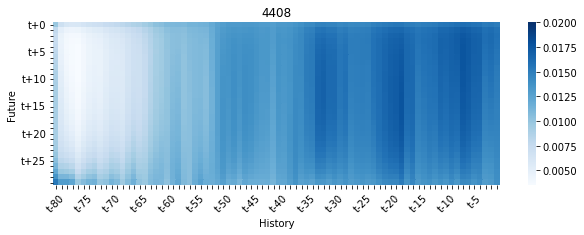

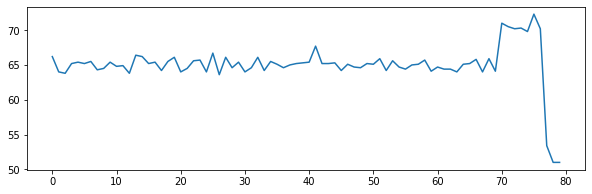

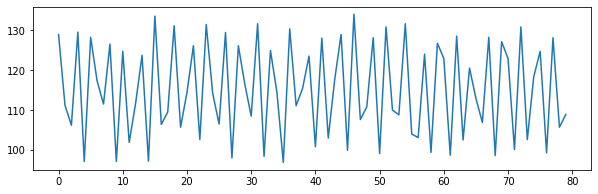

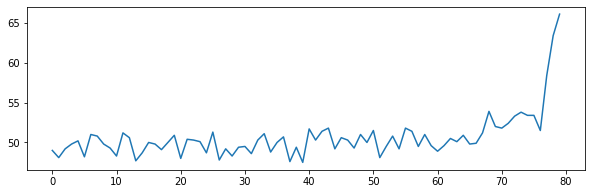

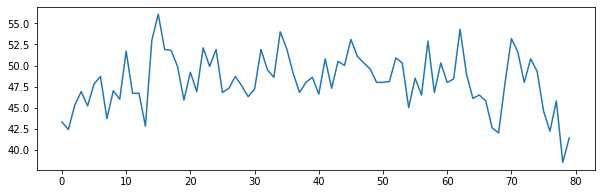

In [ ]:
for i in range(Weights_WAT.shape[0]):
    xlabel = [f't-{x}' if x%5 == 0 else " " for x in range(Len_Hist, 0, -1)]
    ylabel = [f't+{x}' if x%5 == 0 else " " for x in range(Len_Futr)]

    corner = Weights_WAT[i, -1, 0]

    if corner < 0.016:
        plt.figure(figsize=(10,3))
        ax = sns.heatmap(Weights_WAT[i, :,:], xticklabels=xlabel, yticklabels=ylabel, cmap='Blues', vmax=0.02)
        plt.title(f'{i}')
        plt.xlabel('History')
        plt.ylabel('Future')
        plt.xticks(rotation=45)
        plt.show()

        for var in range(0):
            plt.figure(figsize=(10,3))
            plt.plot(Hist_Train[i, :, var])
            plt.show()

#Training iteration

In [ ]:
Itr = 5
# Interval = 5

CASE 1

In [ ]:
for Model_test_number in range(Itr):

    Name_model_DWGHT = f"{Name_Data_EWA} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} {Num_neurons}, {Model_test_number} BASE"

    Update = False
    if not FileExist(Path_Modeling, f"{Name_model_DWGHT}", 'model') or Update:
        time_start = time.time()

        Model_DWGHT = TC_LSTM_rev(Hist_Train_sc,Futr_Train_sc ,1, Num_neurons, True)
        print(Model_DWGHT.summary())
        history = Model_DWGHT.fit(Hist_Train_sc, Futr_Train_sc,
                                epochs = 10000, callbacks=[Early_stopping_cb],
                                verbose = 2, batch_size=Size_batch,
                                validation_data=(Hist_Test_sc, Futr_Test_sc))
        Model_DWGHT.save(f'{Path_Modeling}/{Name_model_DWGHT}')

        time_end = time.time()
        Time_Training = time_end - time_start

        np.set_printoptions(precision=2)
        print(f"{Time_Training} secs were taken")
        CreateFolder(f"{Path_Modeling}/{Name_model_DWGHT}/{Time_Training} secs were taken")

    else:
        Model_DWGHT = LoadFile(Path_Modeling, f'{Name_model_DWGHT}', 'model')

    Predict_DWGHT = Model_DWGHT.predict(Hist_Test_sc)*std_data[-3:] + mean_data[-3:]

    R2_DWGHT_sc = pd.DataFrame(R_Squared(Predict_DWGHT, Futr_Test).mean(axis=1))
    RMSE_DWHGT_sc = pd.DataFrame(nRMSE(Predict_DWGHT, Futr_Test).mean(axis=1))

    R2_RMSE = pd.concat([R2_DWGHT_sc, RMSE_DWHGT_sc], axis=1)

    if Model_test_number == 0:
        Results_DWHGT = R2_RMSE
    
    else:
        Results_DWHGT = pd.concat([Results_DWHGT, R2_RMSE], axis = 1)


Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 0 BASE
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 1 BASE
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 2 BASE
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 3 BASE
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 4 BASE


In [ ]:
Results_DWHGT

,0,0,0,0,0,0,0,0,0,0
0,0.873713,5.353564,0.902165,4.670968,0.884382,5.126076,0.872554,5.238418,0.906739,4.710902
1,0.895438,5.028190,0.904206,4.637509,0.886122,5.039739,0.883404,5.046146,0.876931,5.026336
2,0.880719,5.413764,0.884580,5.107677,0.872019,5.369060,0.868245,5.433620,0.854833,5.502705
3,0.867155,5.715045,0.870410,5.471383,0.862436,5.625857,0.859612,5.700041,0.842929,5.815058
4,0.857025,5.933027,0.861815,5.721042,0.857450,5.802318,0.855994,5.867702,0.835735,6.029057
5,0.849017,6.099522,0.855565,5.908208,0.854804,5.926753,0.854571,5.979284,0.830324,6.192521
6,0.840490,6.262784,0.849332,6.075737,0.851327,6.051152,0.851663,6.098093,0.823728,6.360882
7,0.830405,6.446227,0.842361,6.243810,0.845093,6.210755,0.846072,6.251651,0.814774,6.562238
8,0.819651,6.642131,0.835451,6.406619,0.836930,6.396973,0.839269,6.421963,0.805054,6.778913
9,0.809926,6.829499,0.829083,6.558781,0.828463,6.587226,0.833045,6.583766,0.796381,6.984112


CASE 2

In [ ]:
for Model_test_number in range(Itr):

    Name_model_DWAT = f"{Name_Data_EWA} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} {Num_neurons}, {Model_test_number} ATT"

    Update = False
    if not FileExist(Path_Modeling, f"{Name_model_DWAT}", 'model') or Update:
        time_start = time.time()

        Model_DWAT = ATT_TC_LSTM(Hist_Train_sc, Futr_Train_sc, 1 ,Num_neurons)
        print(Model_DWAT.summary())
        history = Model_DWAT.fit(Hist_Train_sc, Futr_Train_sc,
                                epochs = 10000, callbacks=[Early_stopping_cb],
                                verbose = 2, batch_size=Size_batch,
                                validation_data=(Hist_Test_sc, Futr_Test_sc))
        Model_DWAT.save(f'{Path_Modeling}/{Name_model_DWAT}')

        time_end = time.time()
        Time_Training = time_end - time_start

        np.set_printoptions(precision=2)
        print(f"{Time_Training} secs were taken")
        CreateFolder(f"{Path_Modeling}/{Name_model_DWAT}/{Time_Training} secs were taken")

    else:
        Model_DWAT = LoadFile(Path_Modeling, f'{Name_model_DWAT}', 'model')

    Std_Sens = np.tile(Std_Proc[-3:], (Futr_Test_sc.shape[1],1))
    Mean_Sens = np.tile(Mean_Proc[-3:], (Futr_Test_sc.shape[1],1))

    Predict_DWAT = Model_DWAT.predict(Hist_Test_sc)*Std_Sens+Mean_Sens

    R2_DWAT_sc = pd.DataFrame(R_Squared(Predict_DWAT, Futr_Test).mean(axis=1))
    RMSE_DWAT_sc = pd.DataFrame(nRMSE(Predict_DWAT, Futr_Test).mean(axis=1))

    R2_RMSE = pd.concat([R2_DWAT_sc, RMSE_DWAT_sc], axis=1)

    if Model_test_number == 0:
        Results_DWAT = R2_RMSE
    
    else:
        Results_DWAT = pd.concat([Results_DWAT, R2_RMSE], axis = 1)


Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 0 ATT
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 1 ATT
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 2 ATT
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 3 ATT
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30 25, 4 ATT


In [ ]:
Results_DWAT

,0,0,0,0,0,0,0,0,0,0
0,0.869739,5.695057,0.877175,5.543177,0.901837,4.900903,0.888209,5.197956,0.840709,6.332613
1,0.885477,5.314302,0.873609,5.516131,0.893689,4.969552,0.864803,5.575788,0.854866,6.057906
2,0.869123,5.613808,0.856664,5.833315,0.879617,5.313848,0.843838,5.969431,0.843844,6.257718
3,0.856840,5.859805,0.845269,6.055059,0.868858,5.595258,0.832209,6.192247,0.836275,6.421349
4,0.848550,6.038978,0.838789,6.198825,0.860736,5.812207,0.827423,6.315516,0.831790,6.534928
5,0.842598,6.174213,0.834861,6.299080,0.853981,5.989859,0.825809,6.392551,0.828835,6.617867
6,0.836644,6.303152,0.830519,6.401360,0.847026,6.159081,0.823687,6.475682,0.824364,6.715373
7,0.829694,6.444907,0.824954,6.523507,0.839403,6.332277,0.819715,6.588369,0.817424,6.846505
8,0.822364,6.594234,0.818935,6.657613,0.831681,6.505393,0.815052,6.716662,0.809491,6.995413
9,0.815940,6.736262,0.813447,6.789702,0.824460,6.670702,0.811173,6.838489,0.802207,7.140581


CASE 3

In [ ]:
for Model_test_number in range(Itr):

        Name_model_WAT = f"{Name_Data_EWA} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr}, DELTA {Delta} {Num_neurons}, {Model_test_number} WATT"

        Update = False
        if not FileExist(Path_Modeling, f"{Name_model_WAT}", 'model') or Update:
            time_start = time.time()

            Model_WAT = ATT_TC_LSTM(Hist_Train_wght_sc, Futr_Train_wght_sc, 1 ,Num_neurons, True)
            print(Model_WAT.summary())
            history = Model_WAT.fit(Hist_Train_wght_sc, Futr_Train_wght_sc,
                                    epochs = 10000, callbacks=[Early_stopping_cb],
                                    verbose = 2, batch_size=Size_batch,
                                    validation_data=(Hist_Test_wght_sc, Futr_Test_wght_sc))
            Model_WAT.save(f'{Path_Modeling}/{Name_model_WAT}')

            time_end = time.time()
            Time_Training = time_end - time_start

            np.set_printoptions(precision=2)
            print(f"{Time_Training} secs were taken")
            CreateFolder(f"{Path_Modeling}/{Name_model_WAT}/{Time_Training} secs were taken")

        else:
            Model_WAT = LoadFile(Path_Modeling, f'{Name_model_WAT}', 'model')

        # Model_WAT = Model(inputs=Model_WAT.input, outputs=[Model_WAT.output, Model_WAT.get_layer('attention_vec').output])

        Std_Sens = np.tile(Std_Proc[-3:], (Futr_Test_sc.shape[1],1))
        Mean_Sens = np.tile(Mean_Proc[-3:], (Futr_Test_sc.shape[1],1))

        Predict_WAT = Model_WAT.predict(Hist_Test_wght_sc)*Std_Proc_wght[-3:] + Mean_Proc_wght[-3:]

        R2_WAT_sc = pd.DataFrame(R_Squared(Predict_WAT/factor, Futr_Test).mean(axis=1))
        RMSE_WAT_sc = pd.DataFrame(nRMSE(Predict_WAT/factor, Futr_Test).mean(axis=1))

        R2_RMSE = pd.concat([R2_WAT_sc, RMSE_WAT_sc], axis=1)

        if Model_test_number == 0:
            Results_WAT = R2_RMSE
        
        else:
            Results_WAT = pd.concat([Results_WAT, R2_RMSE], axis = 1)


Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 0 WATT
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 1 WATT
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 2 WATT
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 3 WATT
Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 4 WATT


In [ ]:
Results_WAT

,0,0,0,0,0,0,0,0,0,0
0,0.926228,4.056177,0.917766,4.472562,0.928304,4.128798,0.933510,4.008413,0.943642,3.563408
1,0.915906,4.388889,0.914596,4.541790,0.919696,4.370085,0.923379,4.272150,0.935007,3.895380
2,0.903963,4.750968,0.906713,4.813288,0.906312,4.758110,0.916049,4.558127,0.924292,4.283003
3,0.894855,5.043764,0.897833,5.091745,0.898197,5.024795,0.911696,4.743352,0.915453,4.606127
4,0.889085,5.255265,0.892353,5.288424,0.893902,5.205211,0.907854,4.908127,0.909827,4.835793
5,0.885066,5.417746,0.888986,5.429587,0.891600,5.332709,0.903770,5.072556,0.906514,4.997432
6,0.880682,5.573817,0.885054,5.566518,0.888743,5.455771,0.898452,5.254839,0.903119,5.145724
7,0.874826,5.749348,0.879477,5.724489,0.883950,5.605186,0.891584,5.460565,0.898167,5.315359
8,0.867733,5.942523,0.872809,5.898409,0.877460,5.780445,0.883846,5.677299,0.891661,5.509735
9,0.860195,6.139092,0.866154,6.072191,0.870257,5.964985,0.876349,5.883611,0.884459,5.711205


# Window length case study

In [ ]:
Step=1
Test_Ratio_Plant = 0.2
Itr = 5

CASE 1

In [ ]:
import itertools

Window_Element = [[20, 40, 60, 80],
               [10, 20, 30, 40, 50, 60]]

Window_List = list(itertools.product(*Window_Element))
Name_Data = f'{Name_Raw_Plant} CLS {Num_Cluster_Plant} SRS {Min_Series}'

for Window in Window_List:
    Len_Hist = Window[0]
    Len_Futr = Window[1]

    #TTslpit
    Data_Train, Data_Test = ListTrainTestSplitSemiRandom(data_cts, Test_Ratio_Plant)

    #Serialize
    Hist_Train, Futr_Train = MakeSeries(Data_Train, Len_Hist, Len_Futr, Step)
    Hist_Test, Futr_Test = MakeSeries(Data_Test, Len_Hist, Len_Futr, Step)

    #Scaling
    mean_data = Hist_Train.mean(axis=0).mean(axis=0)
    std_data = Hist_Train[:,0,:].std(axis=0)

    Mean_Proc = mean_data
    Std_Proc = std_data

    Hist_Train_sc = (Hist_Train - Mean_Proc)/Std_Proc
    Hist_Test_sc = (Hist_Test - Mean_Proc)/Std_Proc

    Futr_Train_sc = (Futr_Train - Mean_Proc[-3:])/Std_Proc[-3:]
    Futr_Test_sc = (Futr_Test - Mean_Proc[-3:])/Std_Proc[-3:]

    for Model_test_number in range(Itr):
        Name_model_DWGHT = f"{Name_Data} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} {Num_neurons}, {Model_test_number} BASE"

        Update = False
        if not FileExist(Path_Modeling, f"{Name_model_DWGHT}", 'model') or Update:
            time_start = time.time()

            Model_DWGHT = TC_LSTM_rev(Hist_Train_sc,Futr_Train_sc ,1, Num_neurons, True)
            print(Model_DWGHT.summary())
            history = Model_DWGHT.fit(Hist_Train_sc, Futr_Train_sc,
                                    epochs = 10000, callbacks=[Early_stopping_cb],
                                    verbose = 2, batch_size=Size_batch,
                                    validation_data=(Hist_Test_sc, Futr_Test_sc))
            Model_DWGHT.save(f'{Path_Modeling}/{Name_model_DWGHT}')

            time_end = time.time()
            Time_Training = time_end - time_start

            np.set_printoptions(precision=2)
            print(f"{Time_Training} secs were taken")
            CreateFolder(f"{Path_Modeling}/{Name_model_DWGHT}/{Time_Training} secs were taken")

        else:
            Model_DWGHT = LoadFile(Path_Modeling, f'{Name_model_DWGHT}', 'model')

        Predict_DW = Model_DWGHT.predict(Hist_Test_sc)* Std_Proc[-3:] + Mean_Proc[-3:]

        R2_DW = pd.DataFrame(R_Squared(Predict_DW, Futr_Test).mean(axis=1))
        NRMSE_DW = pd.DataFrame(nRMSE(Predict_DW, Futr_Test).mean(axis=1))

        R2_RMSE = pd.concat([R2_DW, NRMSE_DW], axis=1)

        if Model_test_number == 0:
            Results_BASE = R2_RMSE
        
        else:
            Results_BASE = pd.concat([Results_BASE, R2_RMSE], axis = 1)

    if Window == Window_List[0]:
        Window_casestudy = Results_BASE
    else:
        Window_casestudy = pd.concat([Window_casestudy, Results_BASE], axis = 1)


In [ ]:
Window_casestudy

CASE 2

In [ ]:
import itertools

for Window in Window_List:
    Len_Hist = Window[0]
    Len_Futr = Window[1]

    #TTslpit
    Data_Train, Data_Test = ListTrainTestSplitSemiRandom(data_cts, Test_Ratio_Plant)

    #Serialize
    Hist_Train, Futr_Train = MakeSeries(Data_Train, Len_Hist, Len_Futr, Step)
    Hist_Test, Futr_Test = MakeSeries(Data_Test, Len_Hist, Len_Futr, Step)

    #Scaling
    mean_data = Hist_Train.mean(axis=0).mean(axis=0)
    std_data = Hist_Train[:,0,:].std(axis=0)

    Mean_Proc = mean_data
    Std_Proc = std_data

    Hist_Train_sc = (Hist_Train - Mean_Proc)/Std_Proc
    Hist_Test_sc = (Hist_Test - Mean_Proc)/Std_Proc

    Futr_Train_sc = (Futr_Train - Mean_Proc[-3:])/Std_Proc[-3:]
    Futr_Test_sc = (Futr_Test - Mean_Proc[-3:])/Std_Proc[-3:]

    for Model_test_number in range(Itr):

        Name_model_AT = f"{Name_Data} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} {Num_neurons}, {Model_test_number} ATT"

        Update = False
        if not FileExist(Path_Modeling, f"{Name_model_AT}", 'model') or Update:
            time_start = time.time()

            Model_AT = ATT_TC_LSTM(Hist_Train_sc, Futr_Train_sc, 1 ,Num_neurons)
            print(Model_AT.summary())
            history = Model_AT.fit(Hist_Train_sc, Futr_Train_sc,
                                    epochs = 10000, callbacks=[Early_stopping_cb],
                                    verbose = 2, batch_size=Size_batch,
                                    validation_data=(Hist_Test_sc, Futr_Test_sc))
            Model_AT.save(f'{Path_Modeling}/{Name_model_AT}')

            time_end = time.time()
            Time_Training = time_end - time_start

            np.set_printoptions(precision=2)
            print(f"{Time_Training} secs were taken")
            CreateFolder(f"{Path_Modeling}/{Name_model_AT}/{Time_Training} secs were taken")

        else:
            Model_AT = LoadFile(Path_Modeling, f'{Name_model_AT}', 'model')


        Predict_AT= Model_AT.predict(Hist_Test_sc) * Std_Proc[-3:] + Mean_Proc[-3:]

        R2_AT = pd.DataFrame(R_Squared(Predict_AT, Futr_Test).mean(axis=1))
        NRMSE_AT = pd.DataFrame(nRMSE(Predict_AT, Futr_Test).mean(axis=1))

        R2_RMSE = pd.concat([R2_AT, NRMSE_AT], axis=1)

        if Model_test_number == 0:
            Results_ATT = R2_RMSE
        
        else:
            Results_ATT = pd.concat([Results_ATT, R2_RMSE], axis = 1)

    if Window == Window_List[0]:
        Window_casestudy_2 = Results_ATT
    else:
        Window_casestudy_2 = pd.concat([Window_casestudy_2, Results_ATT], axis = 1)

Model: "model_52"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_105 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_104 (GRU)                  [(None, 20, 200),    125400      ['input_105[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_52 (RepeatVector  (None, 50, 200)     0           ['gru_104[0][1]']                
 )                                                                                                
                                                                                           

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 0 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 0 ATT/assets


95.86370062828064 secs were taken
Model: "model_53"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_107 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_106 (GRU)                  [(None, 20, 200),    125400      ['input_107[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_53 (RepeatVector  (None, 50, 200)     0           ['gru_106[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 1 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 1 ATT/assets


95.63794827461243 secs were taken
Model: "model_54"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_109 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_108 (GRU)                  [(None, 20, 200),    125400      ['input_109[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_54 (RepeatVector  (None, 50, 200)     0           ['gru_108[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 2 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 2 ATT/assets


95.91911005973816 secs were taken
Model: "model_55"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_111 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_110 (GRU)                  [(None, 20, 200),    125400      ['input_111[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_55 (RepeatVector  (None, 50, 200)     0           ['gru_110[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 3 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 3 ATT/assets


95.9807186126709 secs were taken
Model: "model_56"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_113 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_112 (GRU)                  [(None, 20, 200),    125400      ['input_113[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_56 (RepeatVector  (None, 50, 200)     0           ['gru_112[0][1]']                
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 4 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 50 200, 4 ATT/assets


60.509156703948975 secs were taken
Model: "model_57"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_115 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_114 (GRU)                  [(None, 20, 200),    125400      ['input_115[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_57 (RepeatVector  (None, 60, 200)     0           ['gru_114[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 0 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 0 ATT/assets


61.94057536125183 secs were taken
Model: "model_58"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_117 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_116 (GRU)                  [(None, 20, 200),    125400      ['input_117[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_58 (RepeatVector  (None, 60, 200)     0           ['gru_116[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 1 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 1 ATT/assets


95.69225478172302 secs were taken
Model: "model_59"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_119 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_118 (GRU)                  [(None, 20, 200),    125400      ['input_119[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_59 (RepeatVector  (None, 60, 200)     0           ['gru_118[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 2 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 2 ATT/assets


63.179112672805786 secs were taken
Model: "model_60"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_121 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_120 (GRU)                  [(None, 20, 200),    125400      ['input_121[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_60 (RepeatVector  (None, 60, 200)     0           ['gru_120[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 3 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 3 ATT/assets


96.25944137573242 secs were taken
Model: "model_61"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_123 (InputLayer)         [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_122 (GRU)                  [(None, 20, 200),    125400      ['input_123[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_61 (RepeatVector  (None, 60, 200)     0           ['gru_122[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 4 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 20 FUTURE 60 200, 4 ATT/assets


63.71759295463562 secs were taken
Model: "model_62"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_125 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_124 (GRU)                  [(None, 40, 200),    125400      ['input_125[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_62 (RepeatVector  (None, 50, 200)     0           ['gru_124[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 0 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 0 ATT/assets


96.02164053916931 secs were taken
Model: "model_63"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_127 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_126 (GRU)                  [(None, 40, 200),    125400      ['input_127[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_63 (RepeatVector  (None, 50, 200)     0           ['gru_126[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 1 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 1 ATT/assets


63.64442157745361 secs were taken
Model: "model_64"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_129 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_128 (GRU)                  [(None, 40, 200),    125400      ['input_129[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_64 (RepeatVector  (None, 50, 200)     0           ['gru_128[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 2 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 2 ATT/assets


71.21126008033752 secs were taken
Model: "model_65"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_131 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_130 (GRU)                  [(None, 40, 200),    125400      ['input_131[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_65 (RepeatVector  (None, 50, 200)     0           ['gru_130[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 3 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 3 ATT/assets


96.80697345733643 secs were taken
Model: "model_66"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_133 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_132 (GRU)                  [(None, 40, 200),    125400      ['input_133[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_66 (RepeatVector  (None, 50, 200)     0           ['gru_132[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 4 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 50 200, 4 ATT/assets


95.9312093257904 secs were taken
Model: "model_67"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_135 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_134 (GRU)                  [(None, 40, 200),    125400      ['input_135[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_67 (RepeatVector  (None, 60, 200)     0           ['gru_134[0][1]']                
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 0 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 0 ATT/assets


96.11947059631348 secs were taken
Model: "model_68"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_137 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_136 (GRU)                  [(None, 40, 200),    125400      ['input_137[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_68 (RepeatVector  (None, 60, 200)     0           ['gru_136[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 1 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 1 ATT/assets


76.96035766601562 secs were taken
Model: "model_69"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_139 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_138 (GRU)                  [(None, 40, 200),    125400      ['input_139[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_69 (RepeatVector  (None, 60, 200)     0           ['gru_138[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 2 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 2 ATT/assets


96.36095929145813 secs were taken
Model: "model_70"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_141 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_140 (GRU)                  [(None, 40, 200),    125400      ['input_141[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_70 (RepeatVector  (None, 60, 200)     0           ['gru_140[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 3 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 3 ATT/assets


95.9772744178772 secs were taken
Model: "model_71"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_143 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_142 (GRU)                  [(None, 40, 200),    125400      ['input_143[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_71 (RepeatVector  (None, 60, 200)     0           ['gru_142[0][1]']                
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 4 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 40 FUTURE 60 200, 4 ATT/assets


69.1218638420105 secs were taken
Model: "model_72"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_145 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_144 (GRU)                  [(None, 60, 200),    125400      ['input_145[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_72 (RepeatVector  (None, 50, 200)     0           ['gru_144[0][1]']                
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 0 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 0 ATT/assets


96.95548605918884 secs were taken
Model: "model_73"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_147 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_146 (GRU)                  [(None, 60, 200),    125400      ['input_147[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_73 (RepeatVector  (None, 50, 200)     0           ['gru_146[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 1 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 1 ATT/assets


71.85433077812195 secs were taken
Model: "model_74"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_149 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_148 (GRU)                  [(None, 60, 200),    125400      ['input_149[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_74 (RepeatVector  (None, 50, 200)     0           ['gru_148[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 2 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 2 ATT/assets


96.22052216529846 secs were taken
Model: "model_75"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_151 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_150 (GRU)                  [(None, 60, 200),    125400      ['input_151[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_75 (RepeatVector  (None, 50, 200)     0           ['gru_150[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 3 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 3 ATT/assets


96.3618586063385 secs were taken
Model: "model_76"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_153 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_152 (GRU)                  [(None, 60, 200),    125400      ['input_153[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_76 (RepeatVector  (None, 50, 200)     0           ['gru_152[0][1]']                
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 4 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 50 200, 4 ATT/assets


83.90753102302551 secs were taken
Model: "model_77"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_155 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_154 (GRU)                  [(None, 60, 200),    125400      ['input_155[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_77 (RepeatVector  (None, 60, 200)     0           ['gru_154[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 0 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 0 ATT/assets


155.7012655735016 secs were taken
Model: "model_78"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_157 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_156 (GRU)                  [(None, 60, 200),    125400      ['input_157[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_78 (RepeatVector  (None, 60, 200)     0           ['gru_156[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 1 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 1 ATT/assets


70.51079440116882 secs were taken
Model: "model_79"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_159 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_158 (GRU)                  [(None, 60, 200),    125400      ['input_159[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_79 (RepeatVector  (None, 60, 200)     0           ['gru_158[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 2 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 2 ATT/assets


97.45918321609497 secs were taken
Model: "model_80"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_161 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_160 (GRU)                  [(None, 60, 200),    125400      ['input_161[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_80 (RepeatVector  (None, 60, 200)     0           ['gru_160[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 3 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 3 ATT/assets


101.8006341457367 secs were taken
Model: "model_81"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_163 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_162 (GRU)                  [(None, 60, 200),    125400      ['input_163[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_81 (RepeatVector  (None, 60, 200)     0           ['gru_162[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 4 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 60 FUTURE 60 200, 4 ATT/assets


155.67978930473328 secs were taken
Model: "model_82"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_165 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_164 (GRU)                  [(None, 80, 200),    125400      ['input_165[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_82 (RepeatVector  (None, 50, 200)     0           ['gru_164[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 0 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 0 ATT/assets


72.71378302574158 secs were taken
Model: "model_83"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_167 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_166 (GRU)                  [(None, 80, 200),    125400      ['input_167[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_83 (RepeatVector  (None, 50, 200)     0           ['gru_166[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 1 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 1 ATT/assets


95.48733186721802 secs were taken
Model: "model_84"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_169 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_168 (GRU)                  [(None, 80, 200),    125400      ['input_169[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_84 (RepeatVector  (None, 50, 200)     0           ['gru_168[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 2 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 2 ATT/assets


74.10731840133667 secs were taken
Model: "model_85"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_171 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_170 (GRU)                  [(None, 80, 200),    125400      ['input_171[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_85 (RepeatVector  (None, 50, 200)     0           ['gru_170[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 3 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 3 ATT/assets


95.62041354179382 secs were taken
Model: "model_86"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_173 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_172 (GRU)                  [(None, 80, 200),    125400      ['input_173[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_86 (RepeatVector  (None, 50, 200)     0           ['gru_172[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 4 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 50 200, 4 ATT/assets


94.77591848373413 secs were taken
Model: "model_87"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_175 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_174 (GRU)                  [(None, 80, 200),    125400      ['input_175[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_87 (RepeatVector  (None, 60, 200)     0           ['gru_174[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 0 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 0 ATT/assets


96.15777778625488 secs were taken
Model: "model_88"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_177 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_176 (GRU)                  [(None, 80, 200),    125400      ['input_177[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_88 (RepeatVector  (None, 60, 200)     0           ['gru_176[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 1 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 1 ATT/assets


155.8276083469391 secs were taken
Model: "model_89"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_179 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_178 (GRU)                  [(None, 80, 200),    125400      ['input_179[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_89 (RepeatVector  (None, 60, 200)     0           ['gru_178[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 2 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 2 ATT/assets


155.73005652427673 secs were taken
Model: "model_90"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_181 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_180 (GRU)                  [(None, 80, 200),    125400      ['input_181[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_90 (RepeatVector  (None, 60, 200)     0           ['gru_180[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 3 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 3 ATT/assets


78.7977728843689 secs were taken
Model: "model_91"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_183 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_182 (GRU)                  [(None, 80, 200),    125400      ['input_183[0][0]']              
                                 (None, 200)]                                                     
                                                                                                  
 repeat_vector_91 (RepeatVector  (None, 60, 200)     0           ['gru_182[0][1]']                
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 4 ATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October RS 10 Cluster 2 Series 500 EWA 0.6 TS 0.2 HISTORY 80 FUTURE 60 200, 4 ATT/assets


95.42279553413391 secs were taken


In [ ]:
Window_casestudy_2

,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0.950945,4.426657,0.951469,4.416522,0.962064,3.864791,0.954298,4.288495,0.953547,4.304490,0.915766,5.921933,0.922013,5.684904,0.928969,5.419394,0.937407,5.080344,0.933954,5.237059,0.947411,4.632641,0.928796,5.329124,0.959633,4.051076,0.945725,4.704888,0.948224,4.588309,0.922939,5.814957,0.955513,4.426980,0.944033,4.959596,0.944618,4.932140,0.938901,5.161235,0.960039,4.142581,0.937635,5.246769,0.946416,4.866033,0.931915,5.527086,0.959329,4.184475,0.949052,4.581944,0.822136,8.478643,0.950077,4.488946,0.954546,4.292321,0.953365,4.343800,0.849926,8.326759,0.937826,5.436422,0.927308,5.882748,0.861241,8.058939,0.932572,5.693669,0.933233,5.688638,0.944487,5.194467,0.935877,5.613963,0.924458,6.082503,0.936627,5.573048
1,0.954285,4.230856,0.953157,4.318899,0.956051,4.155702,0.953932,4.250355,0.955691,4.183389,0.924482,5.605512,0.928122,5.454996,0.937196,5.079980,0.939183,5.004426,0.936119,5.135268,0.950774,4.505958,0.943411,4.839945,0.955079,4.273474,0.951229,4.510326,0.950792,4.516248,0.941212,5.084036,0.952571,4.569243,0.948364,4.745373,0.949985,4.697607,0.951258,4.625418,0.957255,4.289751,0.947159,4.811197,0.948448,4.737456,0.940065,5.109435,0.956794,4.292687,0.941374,4.905026,0.904757,6.274492,0.945235,4.671158,0.949528,4.508231,0.947595,4.625356,0.916391,6.274428,0.938250,5.429883,0.941059,5.293401,0.924021,6.011934,0.937053,5.501833,0.938916,5.394097,0.939299,5.423037,0.935774,5.609596,0.940595,5.412526,0.937252,5.530249
2,0.948428,4.511223,0.946893,4.600697,0.949672,4.459061,0.948477,4.512429,0.949082,4.491141,0.917170,5.865507,0.922244,5.674091,0.929837,5.379609,0.930777,5.347830,0.928638,5.432132,0.943323,4.857678,0.937894,5.081996,0.947621,4.649153,0.942697,4.903143,0.943347,4.868168,0.937297,5.248608,0.945248,4.919648,0.942068,5.034945,0.944382,4.955474,0.944660,4.932249,0.952950,4.512211,0.942727,5.018168,0.942837,4.986644,0.935244,5.316282,0.952028,4.530527,0.935509,5.159733,0.917528,5.868661,0.939582,4.939482,0.944579,4.738731,0.940548,4.947049,0.922725,6.057130,0.932694,5.691324,0.934072,5.606593,0.928668,5.834421,0.931409,5.754479,0.938346,5.423758,0.934100,5.661258,0.931829,5.787406,0.936794,5.590233,0.934668,5.631346
3,0.943337,4.751325,0.942435,4.797621,0.944553,4.696043,0.943418,4.744838,0.944188,4.712943,0.909929,6.121166,0.915653,5.917499,0.922020,5.690235,0.922764,5.664247,0.920823,5.734484,0.936651,5.159730,0.932384,5.315550,0.940867,4.973960,0.935096,5.230657,0.936963,5.156781,0.932698,5.446892,0.938420,5.226853,0.937217,5.255540,0.939979,5.154565,0.939528,5.163988,0.949032,4.705250,0.938477,5.209180,0.938199,5.187902,0.932558,5.432209,0.947450,4.748002,0.929924,5.387716,0.916648,5.905600,0.934725,5.162943,0.939914,4.949571,0.933373,5.250227,0.919104,6.221843,0.927562,5.926217,0.928223,5.875269,0.924675,6.009238,0.926323,5.982314,0.936280,5.530107,0.927585,5.937332,0.927897,5.964147,0.931679,5.818823,0.932053,5.745712
4,0.939587,4.924587,0.939280,4.937640,0.940683,4.870903,0.939043,4.935577,0.940697,4.870658,0.904196,6.325340,0.909909,6.129288,0.915226,5.954217,0.916053,5.924295,0.913895,5.997294,0.931302,5.395266,0.928223,5.495748,0.935194,5.234196,0.929333,5.474067,0.932063,5.372686,0.929039,5.605773,0.932870,5.463170,0.933620,5.416467,0.936498,5.308310,0.935944,5.322806,0.945578,4.867511,0.935046,5.358029,0.934468,5.343828,0.930977,5.498108,0.943422,4.929880,0.924626,5.592957,0.913897,6.003451,0.930459,5.351021,0.935518,5.142501,0.926922,5.506102,0.915076,6.402789,0.923100,6.125084,0.923923,6.075223,0.920662,6.190679,0.922423,6.156355,0.934118,5.640345,0.921162,6.197532,0.924321,6.118713,0.927222,6.011077,0.929729,5.853196
5,0.936783,5.049774,0.936933,5.040718,0.937704,5.001119,0.935328,5.088428,0.938125,4.985108,0.899730,6.487315,0.905064,6.308149,0.909523,6.171721,0.910605,6.133016,0.907982,6.218304,0.927273,5.569531,0.925388,5.623581,0.930597,5.

CASE 3

In [ ]:
import itertools


for Window in Window_List:
    Len_Hist = Window[0]
    Len_Futr = Window[1]

    #TTslpit
    Data_Train, Data_Test = ListTrainTestSplitSemiRandom(data_cts, Test_Ratio_Plant)

    #Serialize
    Hist_Train, Futr_Train = MakeSeries(Data_Train, Len_Hist, Len_Futr, Step)
    Hist_Test, Futr_Test = MakeSeries(Data_Test, Len_Hist, Len_Futr, Step)

    #Supervised ATT
    Delta = 1.5
    factor = FactorCalculate(Delta, Len_Futr, Num_Sens, 'linear')

    Futr_Train_wght = Futr_Train * factor
    Futr_Test_wght = Futr_Test * factor

    #Scaling
    mean_mani = Hist_Train[:,0,:Num_Mani].mean(axis=0)
    std_mani = Hist_Train[:,0,:Num_Mani].std(axis=0)

    mean_sens = Futr_Train_wght.mean(axis=0).mean(axis=0)
    std_sens = Futr_Train_wght[:,0,:].std(axis=0)

    Mean_Proc_wght = np.concatenate([mean_mani,mean_sens])
    Std_Proc_wght = np.concatenate([std_mani, std_sens ])

    Hist_Train_wght_sc = (Hist_Train - Mean_Proc_wght)/Std_Proc_wght
    Hist_Test_wght_sc = (Hist_Test - Mean_Proc_wght)/Std_Proc_wght

    Futr_Train_wght_sc = (Futr_Train_wght - Mean_Proc_wght[-3:])/Std_Proc_wght[-3:]
    Futr_Test_wght_sc = (Futr_Test_wght - Mean_Proc_wght[-3:])/Std_Proc_wght[-3:]

    for Model_test_number in range(Itr):

        Name_model_WAT = f"{Name_Data} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr}, DELTA {Delta} {Num_neurons}, {Model_test_number} WATT"

        Update = False
        if not FileExist(Path_Modeling, f"{Name_model_WAT}", 'model') or Update:
            time_start = time.time()

            Model_WAT = ATT_TC_LSTM(Hist_Train_wght_sc, Futr_Train_wght_sc, 1 ,Num_neurons, True)
            print(Model_WAT.summary())
            history = Model_WAT.fit(Hist_Train_wght_sc, Futr_Train_wght_sc,
                                    epochs = 10000, callbacks=[Early_stopping_cb],
                                    verbose = 2, batch_size=Size_batch,
                                    validation_data=(Hist_Test_wght_sc, Futr_Test_wght_sc))
            Model_WAT.save(f'{Path_Modeling}/{Name_model_WAT}')

            time_end = time.time()
            Time_Training = time_end - time_start

            np.set_printoptions(precision=2)
            print(f"{Time_Training} secs were taken")
            CreateFolder(f"{Path_Modeling}/{Name_model_WAT}/{Time_Training} secs were taken")

        else:
            Model_WAT = LoadFile(Path_Modeling, f'{Name_model_WAT}', 'model')

        # Model_WAT = Model(inputs=Model_WAT.input, outputs=[Model_WAT.output, Model_WAT.get_layer('attention_vec').output])

        Predict_WAT = Model_WAT.predict(Hist_Test_wght_sc)*Std_Proc_wght[-3:] + Mean_Proc_wght[-3:]

        R2_WAT_sc = pd.DataFrame(R_Squared(Predict_WAT/factor, Futr_Test).mean(axis=1))
        RMSE_WAT_sc = pd.DataFrame(nRMSE(Predict_WAT/factor, Futr_Test).mean(axis=1))

        R2_RMSE = pd.concat([R2_WAT_sc, RMSE_WAT_sc], axis=1)

        if Model_test_number == 0:
            Results_WAT = R2_RMSE
        
        else:
            Results_WAT = pd.concat([Results_WAT, R2_RMSE], axis = 1)

    if Window == Window_List[0]:
        Window_casestudy_3 = Results_WAT
    else:
        Window_casestudy_3 = pd.concat([Window_casestudy_3, Results_WAT], axis = 1)

Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 20, 7)]      0           []                               
                                                                                                  
 gru (GRU)                      [(None, 20, 25),     2550        ['input_1[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector (RepeatVector)   (None, 10, 25)       0           ['gru[0][1]']                    
                                                                                                  
 gru_1 (GRU)                    (None, 10, 25)      

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


139.50461101531982 secs were taken
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_2 (GRU)                    [(None, 20, 25),     2550        ['input_3[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_1 (RepeatVector)  (None, 10, 25)      0           ['gru_2[0][1]']                  
                                                                                                  
 gru_3 (GRU)                    (None, 10, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.09303092956543 secs were taken
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_4 (GRU)                    [(None, 20, 25),     2550        ['input_5[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_2 (RepeatVector)  (None, 10, 25)      0           ['gru_4[0][1]']                  
                                                                                                  
 gru_5 (GRU)                    (None, 10, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


171.60881567001343 secs were taken
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_6 (GRU)                    [(None, 20, 25),     2550        ['input_7[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_3 (RepeatVector)  (None, 10, 25)      0           ['gru_6[0][1]']                  
                                                                                                  
 gru_7 (GRU)                    (None, 10, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.1067478656769 secs were taken
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_8 (GRU)                    [(None, 20, 25),     2550        ['input_9[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_4 (RepeatVector)  (None, 10, 25)      0           ['gru_8[0][1]']                  
                                                                                                  
 gru_9 (GRU)                    (None, 10, 25)       3900 

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 10, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


332.1620044708252 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_10 (GRU)                   [(None, 20, 25),     2550        ['input_11[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_5 (RepeatVector)  (None, 20, 25)      0           ['gru_10[0][1]']                 
                                                                                                  
 gru_11 (GRU)   

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.00241088867188 secs were taken
Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_12 (GRU)                   [(None, 20, 25),     2550        ['input_13[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_6 (RepeatVector)  (None, 20, 25)      0           ['gru_12[0][1]']                 
                                                                                                  
 gru_13 (GRU)                   (None, 20, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


164.93592524528503 secs were taken
Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_14 (GRU)                   [(None, 20, 25),     2550        ['input_15[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_7 (RepeatVector)  (None, 20, 25)      0           ['gru_14[0][1]']                 
                                                                                                  
 gru_15 (GRU)                   (None, 20, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


183.83100080490112 secs were taken
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_16 (GRU)                   [(None, 20, 25),     2550        ['input_17[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_8 (RepeatVector)  (None, 20, 25)      0           ['gru_16[0][1]']                 
                                                                                                  
 gru_17 (GRU)                   (None, 20, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


132.59480023384094 secs were taken
Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_19 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_18 (GRU)                   [(None, 20, 25),     2550        ['input_19[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_9 (RepeatVector)  (None, 20, 25)      0           ['gru_18[0][1]']                 
                                                                                                  
 gru_19 (GRU)                   (None, 20, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 20, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


211.92067217826843 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_20 (GRU)                   [(None, 20, 25),     2550        ['input_21[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_10 (RepeatVector  (None, 30, 25)      0           ['gru_20[0][1]']                 
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.29800820350647 secs were taken
Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_22 (GRU)                   [(None, 20, 25),     2550        ['input_23[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_11 (RepeatVector  (None, 30, 25)      0           ['gru_22[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


143.3341085910797 secs were taken
Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_25 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_24 (GRU)                   [(None, 20, 25),     2550        ['input_25[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_12 (RepeatVector  (None, 30, 25)      0           ['gru_24[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.8721559047699 secs were taken
Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_27 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_26 (GRU)                   [(None, 20, 25),     2550        ['input_27[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_13 (RepeatVector  (None, 30, 25)      0           ['gru_26[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.20166635513306 secs were taken
Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_29 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_28 (GRU)                   [(None, 20, 25),     2550        ['input_29[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_14 (RepeatVector  (None, 30, 25)      0           ['gru_28[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 30, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.11883759498596 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_31 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_30 (GRU)                   [(None, 20, 25),     2550        ['input_31[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_15 (RepeatVector  (None, 40, 25)      0           ['gru_30[0][1]']                 
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.0240774154663 secs were taken
Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_33 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_32 (GRU)                   [(None, 20, 25),     2550        ['input_33[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_16 (RepeatVector  (None, 40, 25)      0           ['gru_32[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.87798762321472 secs were taken
Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_35 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_34 (GRU)                   [(None, 20, 25),     2550        ['input_35[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_17 (RepeatVector  (None, 40, 25)      0           ['gru_34[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


180.32337141036987 secs were taken
Model: "model_18"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_37 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_36 (GRU)                   [(None, 20, 25),     2550        ['input_37[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_18 (RepeatVector  (None, 40, 25)      0           ['gru_36[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


114.06977844238281 secs were taken
Model: "model_19"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_39 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_38 (GRU)                   [(None, 20, 25),     2550        ['input_39[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_19 (RepeatVector  (None, 40, 25)      0           ['gru_38[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 40, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.09779334068298 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_20"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_41 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_40 (GRU)                   [(None, 20, 25),     2550        ['input_41[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_20 (RepeatVector  (None, 50, 25)      0           ['gru_40[0][1]']                 
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.0216989517212 secs were taken
Model: "model_21"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_43 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_42 (GRU)                   [(None, 20, 25),     2550        ['input_43[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_21 (RepeatVector  (None, 50, 25)      0           ['gru_42[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


92.09295964241028 secs were taken
Model: "model_22"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_45 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_44 (GRU)                   [(None, 20, 25),     2550        ['input_45[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_22 (RepeatVector  (None, 50, 25)      0           ['gru_44[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


91.82971334457397 secs were taken
Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_47 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_46 (GRU)                   [(None, 20, 25),     2550        ['input_47[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_23 (RepeatVector  (None, 50, 25)      0           ['gru_46[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.99545216560364 secs were taken
Model: "model_24"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_49 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_48 (GRU)                   [(None, 20, 25),     2550        ['input_49[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_24 (RepeatVector  (None, 50, 25)      0           ['gru_48[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 50, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.07338881492615 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_25"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_51 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_50 (GRU)                   [(None, 20, 25),     2550        ['input_51[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_25 (RepeatVector  (None, 60, 25)      0           ['gru_50[0][1]']                 
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.1703073978424 secs were taken
Model: "model_26"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_53 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_52 (GRU)                   [(None, 20, 25),     2550        ['input_53[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_26 (RepeatVector  (None, 60, 25)      0           ['gru_52[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


149.10027647018433 secs were taken
Model: "model_27"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_55 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_54 (GRU)                   [(None, 20, 25),     2550        ['input_55[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_27 (RepeatVector  (None, 60, 25)      0           ['gru_54[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.75101685523987 secs were taken
Model: "model_28"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_57 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_56 (GRU)                   [(None, 20, 25),     2550        ['input_57[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_28 (RepeatVector  (None, 60, 25)      0           ['gru_56[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


96.14938497543335 secs were taken
Model: "model_29"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_59 (InputLayer)          [(None, 20, 7)]      0           []                               
                                                                                                  
 gru_58 (GRU)                   [(None, 20, 25),     2550        ['input_59[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_29 (RepeatVector  (None, 60, 25)      0           ['gru_58[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 20 FUTURE 60, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.8579432964325 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_30"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_61 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_60 (GRU)                   [(None, 40, 25),     2550        ['input_61[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_30 (RepeatVector  (None, 10, 25)      0           ['gru_60[0][1]']                 
 )                                                                                                
               

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


185.7619595527649 secs were taken
Model: "model_31"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_63 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_62 (GRU)                   [(None, 40, 25),     2550        ['input_63[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_31 (RepeatVector  (None, 10, 25)      0           ['gru_62[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


211.93852996826172 secs were taken
Model: "model_32"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_65 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_64 (GRU)                   [(None, 40, 25),     2550        ['input_65[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_32 (RepeatVector  (None, 10, 25)      0           ['gru_64[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


195.60558128356934 secs were taken
Model: "model_33"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_67 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_66 (GRU)                   [(None, 40, 25),     2550        ['input_67[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_33 (RepeatVector  (None, 10, 25)      0           ['gru_66[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


182.93876671791077 secs were taken
Model: "model_34"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_69 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_68 (GRU)                   [(None, 40, 25),     2550        ['input_69[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_34 (RepeatVector  (None, 10, 25)      0           ['gru_68[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 10, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


256.1667923927307 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_35"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_71 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_70 (GRU)                   [(None, 40, 25),     2550        ['input_71[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_35 (RepeatVector  (None, 20, 25)      0           ['gru_70[0][1]']                 
 )                                                                                                
               

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


227.87722063064575 secs were taken
Model: "model_36"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_73 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_72 (GRU)                   [(None, 40, 25),     2550        ['input_73[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_36 (RepeatVector  (None, 20, 25)      0           ['gru_72[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


332.17750334739685 secs were taken
Model: "model_37"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_75 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_74 (GRU)                   [(None, 40, 25),     2550        ['input_75[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_37 (RepeatVector  (None, 20, 25)      0           ['gru_74[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


271.9328787326813 secs were taken
Model: "model_38"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_77 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_76 (GRU)                   [(None, 40, 25),     2550        ['input_77[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_38 (RepeatVector  (None, 20, 25)      0           ['gru_76[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


254.54735159873962 secs were taken
Model: "model_39"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_79 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_78 (GRU)                   [(None, 40, 25),     2550        ['input_79[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_39 (RepeatVector  (None, 20, 25)      0           ['gru_78[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 20, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


211.9967062473297 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_40"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_81 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_80 (GRU)                   [(None, 40, 25),     2550        ['input_81[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_40 (RepeatVector  (None, 30, 25)      0           ['gru_80[0][1]']                 
 )                                                                                                
               

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.02323961257935 secs were taken
Model: "model_41"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_83 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_82 (GRU)                   [(None, 40, 25),     2550        ['input_83[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_41 (RepeatVector  (None, 30, 25)      0           ['gru_82[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.9344916343689 secs were taken
Model: "model_42"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_85 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_84 (GRU)                   [(None, 40, 25),     2550        ['input_85[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_42 (RepeatVector  (None, 30, 25)      0           ['gru_84[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


174.17193293571472 secs were taken
Model: "model_43"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_87 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_86 (GRU)                   [(None, 40, 25),     2550        ['input_87[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_43 (RepeatVector  (None, 30, 25)      0           ['gru_86[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.656231880188 secs were taken
Model: "model_44"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_89 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_88 (GRU)                   [(None, 40, 25),     2550        ['input_89[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_44 (RepeatVector  (None, 30, 25)      0           ['gru_88[0][1]']                 
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 30, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


103.52157711982727 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_45"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_91 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_90 (GRU)                   [(None, 40, 25),     2550        ['input_91[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_45 (RepeatVector  (None, 40, 25)      0           ['gru_90[0][1]']                 
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.09948539733887 secs were taken
Model: "model_46"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_93 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_92 (GRU)                   [(None, 40, 25),     2550        ['input_93[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_46 (RepeatVector  (None, 40, 25)      0           ['gru_92[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


211.61727094650269 secs were taken
Model: "model_47"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_95 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_94 (GRU)                   [(None, 40, 25),     2550        ['input_95[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_47 (RepeatVector  (None, 40, 25)      0           ['gru_94[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.93638253211975 secs were taken
Model: "model_48"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_97 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_96 (GRU)                   [(None, 40, 25),     2550        ['input_97[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_48 (RepeatVector  (None, 40, 25)      0           ['gru_96[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


121.8717577457428 secs were taken
Model: "model_49"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_99 (InputLayer)          [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_98 (GRU)                   [(None, 40, 25),     2550        ['input_99[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_49 (RepeatVector  (None, 40, 25)      0           ['gru_98[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 40, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.0416717529297 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_101 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_100 (GRU)                  [(None, 40, 25),     2550        ['input_101[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_50 (RepeatVector  (None, 50, 25)      0           ['gru_100[0][1]']                
 )                                                                                                
               

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.84643411636353 secs were taken
Model: "model_51"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_103 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_102 (GRU)                  [(None, 40, 25),     2550        ['input_103[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_51 (RepeatVector  (None, 50, 25)      0           ['gru_102[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.03159761428833 secs were taken
Model: "model_52"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_105 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_104 (GRU)                  [(None, 40, 25),     2550        ['input_105[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_52 (RepeatVector  (None, 50, 25)      0           ['gru_104[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.14626812934875 secs were taken
Model: "model_53"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_107 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_106 (GRU)                  [(None, 40, 25),     2550        ['input_107[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_53 (RepeatVector  (None, 50, 25)      0           ['gru_106[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


92.05916213989258 secs were taken
Model: "model_54"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_109 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_108 (GRU)                  [(None, 40, 25),     2550        ['input_109[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_54 (RepeatVector  (None, 50, 25)      0           ['gru_108[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 50, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


184.71295952796936 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_55"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_111 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_110 (GRU)                  [(None, 40, 25),     2550        ['input_111[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_55 (RepeatVector  (None, 60, 25)      0           ['gru_110[0][1]']                
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


160.45186114311218 secs were taken
Model: "model_56"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_113 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_112 (GRU)                  [(None, 40, 25),     2550        ['input_113[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_56 (RepeatVector  (None, 60, 25)      0           ['gru_112[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


211.9913990497589 secs were taken
Model: "model_57"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_115 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_114 (GRU)                  [(None, 40, 25),     2550        ['input_115[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_57 (RepeatVector  (None, 60, 25)      0           ['gru_114[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.78742361068726 secs were taken
Model: "model_58"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_117 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_116 (GRU)                  [(None, 40, 25),     2550        ['input_117[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_58 (RepeatVector  (None, 60, 25)      0           ['gru_116[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.90830087661743 secs were taken
Model: "model_59"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_119 (InputLayer)         [(None, 40, 7)]      0           []                               
                                                                                                  
 gru_118 (GRU)                  [(None, 40, 25),     2550        ['input_119[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_59 (RepeatVector  (None, 60, 25)      0           ['gru_118[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 40 FUTURE 60, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.089586019516 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_60"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_121 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_120 (GRU)                  [(None, 60, 25),     2550        ['input_121[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_60 (RepeatVector  (None, 10, 25)      0           ['gru_120[0][1]']                
 )                                                                                                
                

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


159.42486023902893 secs were taken
Model: "model_61"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_123 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_122 (GRU)                  [(None, 60, 25),     2550        ['input_123[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_61 (RepeatVector  (None, 10, 25)      0           ['gru_122[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


331.88290095329285 secs were taken
Model: "model_62"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_125 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_124 (GRU)                  [(None, 60, 25),     2550        ['input_125[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_62 (RepeatVector  (None, 10, 25)      0           ['gru_124[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


169.80776977539062 secs were taken
Model: "model_63"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_127 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_126 (GRU)                  [(None, 60, 25),     2550        ['input_127[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_63 (RepeatVector  (None, 10, 25)      0           ['gru_126[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


211.68608570098877 secs were taken
Model: "model_64"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_129 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_128 (GRU)                  [(None, 60, 25),     2550        ['input_129[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_64 (RepeatVector  (None, 10, 25)      0           ['gru_128[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 10, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


314.56142807006836 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_65"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_131 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_130 (GRU)                  [(None, 60, 25),     2550        ['input_131[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_65 (RepeatVector  (None, 20, 25)      0           ['gru_130[0][1]']                
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


219.36192560195923 secs were taken
Model: "model_66"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_133 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_132 (GRU)                  [(None, 60, 25),     2550        ['input_133[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_66 (RepeatVector  (None, 20, 25)      0           ['gru_132[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


331.6895513534546 secs were taken
Model: "model_67"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_135 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_134 (GRU)                  [(None, 60, 25),     2550        ['input_135[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_67 (RepeatVector  (None, 20, 25)      0           ['gru_134[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


271.9394862651825 secs were taken
Model: "model_68"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_137 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_136 (GRU)                  [(None, 60, 25),     2550        ['input_137[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_68 (RepeatVector  (None, 20, 25)      0           ['gru_136[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


206.97693991661072 secs were taken
Model: "model_69"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_139 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_138 (GRU)                  [(None, 60, 25),     2550        ['input_139[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_69 (RepeatVector  (None, 20, 25)      0           ['gru_138[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 20, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


271.848415851593 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_70"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_141 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_140 (GRU)                  [(None, 60, 25),     2550        ['input_141[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_70 (RepeatVector  (None, 30, 25)      0           ['gru_140[0][1]']                
 )                                                                                                
                

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.0874574184418 secs were taken
Model: "model_71"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_143 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_142 (GRU)                  [(None, 60, 25),     2550        ['input_143[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_71 (RepeatVector  (None, 30, 25)      0           ['gru_142[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


166.95585417747498 secs were taken
Model: "model_72"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_145 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_144 (GRU)                  [(None, 60, 25),     2550        ['input_145[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_72 (RepeatVector  (None, 30, 25)      0           ['gru_144[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.24852752685547 secs were taken
Model: "model_73"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_147 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_146 (GRU)                  [(None, 60, 25),     2550        ['input_147[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_73 (RepeatVector  (None, 30, 25)      0           ['gru_146[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.2448046207428 secs were taken
Model: "model_74"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_149 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_148 (GRU)                  [(None, 60, 25),     2550        ['input_149[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_74 (RepeatVector  (None, 30, 25)      0           ['gru_148[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 30, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


100.30104899406433 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_75"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_151 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_150 (GRU)                  [(None, 60, 25),     2550        ['input_151[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_75 (RepeatVector  (None, 40, 25)      0           ['gru_150[0][1]']                
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


136.27659511566162 secs were taken
Model: "model_76"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_153 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_152 (GRU)                  [(None, 60, 25),     2550        ['input_153[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_76 (RepeatVector  (None, 40, 25)      0           ['gru_152[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


130.02563500404358 secs were taken
Model: "model_77"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_155 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_154 (GRU)                  [(None, 60, 25),     2550        ['input_155[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_77 (RepeatVector  (None, 40, 25)      0           ['gru_154[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


241.1906225681305 secs were taken
Model: "model_78"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_157 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_156 (GRU)                  [(None, 60, 25),     2550        ['input_157[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_78 (RepeatVector  (None, 40, 25)      0           ['gru_156[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


229.75977325439453 secs were taken
Model: "model_79"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_159 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_158 (GRU)                  [(None, 60, 25),     2550        ['input_159[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_79 (RepeatVector  (None, 40, 25)      0           ['gru_158[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 40, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


100.1288013458252 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_80"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_161 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_160 (GRU)                  [(None, 60, 25),     2550        ['input_161[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_80 (RepeatVector  (None, 50, 25)      0           ['gru_160[0][1]']                
 )                                                                                                
               

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.24430680274963 secs were taken
Model: "model_81"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_163 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_162 (GRU)                  [(None, 60, 25),     2550        ['input_163[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_81 (RepeatVector  (None, 50, 25)      0           ['gru_162[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.0286316871643 secs were taken
Model: "model_82"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_165 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_164 (GRU)                  [(None, 60, 25),     2550        ['input_165[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_82 (RepeatVector  (None, 50, 25)      0           ['gru_164[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


154.04212260246277 secs were taken
Model: "model_83"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_167 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_166 (GRU)                  [(None, 60, 25),     2550        ['input_167[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_83 (RepeatVector  (None, 50, 25)      0           ['gru_166[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


165.48220443725586 secs were taken
Model: "model_84"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_169 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_168 (GRU)                  [(None, 60, 25),     2550        ['input_169[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_84 (RepeatVector  (None, 50, 25)      0           ['gru_168[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 50, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


208.61621189117432 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_85"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_171 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_170 (GRU)                  [(None, 60, 25),     2550        ['input_171[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_85 (RepeatVector  (None, 60, 25)      0           ['gru_170[0][1]']                
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


174.246408700943 secs were taken
Model: "model_86"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_173 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_172 (GRU)                  [(None, 60, 25),     2550        ['input_173[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_86 (RepeatVector  (None, 60, 25)      0           ['gru_172[0][1]']                
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.22247862815857 secs were taken
Model: "model_87"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_175 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_174 (GRU)                  [(None, 60, 25),     2550        ['input_175[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_87 (RepeatVector  (None, 60, 25)      0           ['gru_174[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.23613619804382 secs were taken
Model: "model_88"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_177 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_176 (GRU)                  [(None, 60, 25),     2550        ['input_177[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_88 (RepeatVector  (None, 60, 25)      0           ['gru_176[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


271.97407579421997 secs were taken
Model: "model_89"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_179 (InputLayer)         [(None, 60, 7)]      0           []                               
                                                                                                  
 gru_178 (GRU)                  [(None, 60, 25),     2550        ['input_179[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_89 (RepeatVector  (None, 60, 25)      0           ['gru_178[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 60 FUTURE 60, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


143.99810791015625 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_90"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_181 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_180 (GRU)                  [(None, 80, 25),     2550        ['input_181[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_90 (RepeatVector  (None, 10, 25)      0           ['gru_180[0][1]']                
 )                                                                                                
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.2232549190521 secs were taken
Model: "model_91"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_183 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_182 (GRU)                  [(None, 80, 25),     2550        ['input_183[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_91 (RepeatVector  (None, 10, 25)      0           ['gru_182[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


404.6909534931183 secs were taken
Model: "model_92"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_185 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_184 (GRU)                  [(None, 80, 25),     2550        ['input_185[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_92 (RepeatVector  (None, 10, 25)      0           ['gru_184[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.3483364582062 secs were taken
Model: "model_93"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_187 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_186 (GRU)                  [(None, 80, 25),     2550        ['input_187[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_93 (RepeatVector  (None, 10, 25)      0           ['gru_186[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


332.23539304733276 secs were taken
Model: "model_94"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_189 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_188 (GRU)                  [(None, 80, 25),     2550        ['input_189[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_94 (RepeatVector  (None, 10, 25)      0           ['gru_188[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 10, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


204.6786823272705 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_95"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_191 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_190 (GRU)                  [(None, 80, 25),     2550        ['input_191[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_95 (RepeatVector  (None, 20, 25)      0           ['gru_190[0][1]']                
 )                                                                                                
               

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.02853298187256 secs were taken
Model: "model_96"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_193 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_192 (GRU)                  [(None, 80, 25),     2550        ['input_193[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_96 (RepeatVector  (None, 20, 25)      0           ['gru_192[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


332.27777123451233 secs were taken
Model: "model_97"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_195 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_194 (GRU)                  [(None, 80, 25),     2550        ['input_195[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_97 (RepeatVector  (None, 20, 25)      0           ['gru_194[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.9394760131836 secs were taken
Model: "model_98"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_197 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_196 (GRU)                  [(None, 80, 25),     2550        ['input_197[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_98 (RepeatVector  (None, 20, 25)      0           ['gru_196[0][1]']                
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


221.45101642608643 secs were taken
Model: "model_99"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_199 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_198 (GRU)                  [(None, 80, 25),     2550        ['input_199[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_99 (RepeatVector  (None, 20, 25)      0           ['gru_198[0][1]']                
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 20, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


392.30071926116943 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_100"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_201 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_200 (GRU)                  [(None, 80, 25),     2550        ['input_201[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_100 (RepeatVecto  (None, 30, 25)      0           ['gru_200[0][1]']                
 r)                                                                                               
             

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


211.90368461608887 secs were taken
Model: "model_101"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_203 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_202 (GRU)                  [(None, 80, 25),     2550        ['input_203[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_101 (RepeatVecto  (None, 30, 25)      0           ['gru_202[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


332.09479999542236 secs were taken
Model: "model_102"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_205 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_204 (GRU)                  [(None, 80, 25),     2550        ['input_205[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_102 (RepeatVecto  (None, 30, 25)      0           ['gru_204[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.1414315700531 secs were taken
Model: "model_103"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_207 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_206 (GRU)                  [(None, 80, 25),     2550        ['input_207[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_103 (RepeatVecto  (None, 30, 25)      0           ['gru_206[0][1]']                
 r)                                                                                               
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


271.61630034446716 secs were taken
Model: "model_104"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_209 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_208 (GRU)                  [(None, 80, 25),     2550        ['input_209[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_104 (RepeatVecto  (None, 30, 25)      0           ['gru_208[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 30, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


123.1043643951416 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_105"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_211 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_210 (GRU)                  [(None, 80, 25),     2550        ['input_211[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_105 (RepeatVecto  (None, 40, 25)      0           ['gru_210[0][1]']                
 r)                                                                                               
              

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.20631957054138 secs were taken
Model: "model_106"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_213 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_212 (GRU)                  [(None, 80, 25),     2550        ['input_213[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_106 (RepeatVecto  (None, 40, 25)      0           ['gru_212[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


271.7190978527069 secs were taken
Model: "model_107"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_215 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_214 (GRU)                  [(None, 80, 25),     2550        ['input_215[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_107 (RepeatVecto  (None, 40, 25)      0           ['gru_214[0][1]']                
 r)                                                                                               
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


271.9192433357239 secs were taken
Model: "model_108"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_217 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_216 (GRU)                  [(None, 80, 25),     2550        ['input_217[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_108 (RepeatVecto  (None, 40, 25)      0           ['gru_216[0][1]']                
 r)                                                                                               
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


174.18171644210815 secs were taken
Model: "model_109"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_219 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_218 (GRU)                  [(None, 80, 25),     2550        ['input_219[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_109 (RepeatVecto  (None, 40, 25)      0           ['gru_218[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 40, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.13038229942322 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_110"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_221 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_220 (GRU)                  [(None, 80, 25),     2550        ['input_221[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_110 (RepeatVecto  (None, 50, 25)      0           ['gru_220[0][1]']                
 r)                                                                                               
             

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.0090367794037 secs were taken
Model: "model_111"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_223 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_222 (GRU)                  [(None, 80, 25),     2550        ['input_223[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_111 (RepeatVecto  (None, 50, 25)      0           ['gru_222[0][1]']                
 r)                                                                                               
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


156.5426218509674 secs were taken
Model: "model_112"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_225 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_224 (GRU)                  [(None, 80, 25),     2550        ['input_225[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_112 (RepeatVecto  (None, 50, 25)      0           ['gru_224[0][1]']                
 r)                                                                                               
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


271.7603132724762 secs were taken
Model: "model_113"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_227 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_226 (GRU)                  [(None, 80, 25),     2550        ['input_227[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_113 (RepeatVecto  (None, 50, 25)      0           ['gru_226[0][1]']                
 r)                                                                                               
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


211.96363472938538 secs were taken
Model: "model_114"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_229 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_228 (GRU)                  [(None, 80, 25),     2550        ['input_229[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_114 (RepeatVecto  (None, 50, 25)      0           ['gru_228[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


192.52961802482605 secs were taken
Train 11 Test 4
Test Index: [10, 4, 3, 1]
Model: "model_115"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_231 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_230 (GRU)                  [(None, 80, 25),     2550        ['input_231[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_115 (RepeatVecto  (None, 60, 25)      0           ['gru_230[0][1]']                
 r)                                                                                               
             

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.27634167671204 secs were taken
Model: "model_116"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_233 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_232 (GRU)                  [(None, 80, 25),     2550        ['input_233[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_116 (RepeatVecto  (None, 60, 25)      0           ['gru_232[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


119.94509768486023 secs were taken
Model: "model_117"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_235 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_234 (GRU)                  [(None, 80, 25),     2550        ['input_235[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_117 (RepeatVecto  (None, 60, 25)      0           ['gru_234[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


122.89477968215942 secs were taken
Model: "model_118"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_237 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_236 (GRU)                  [(None, 80, 25),     2550        ['input_237[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_118 (RepeatVecto  (None, 60, 25)      0           ['gru_236[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


156.20991611480713 secs were taken
Model: "model_119"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_239 (InputLayer)         [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_238 (GRU)                  [(None, 80, 25),     2550        ['input_239[0][0]']              
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_119 (RepeatVecto  (None, 60, 25)      0           ['gru_238[0][1]']                
 r)                                                                                               
                                                       

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 60, DELTA 1.5 25, 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


164.80704140663147 secs were taken


In [ ]:
Window_casestudy_3.iloc[:,180:240]

,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0.981100,1.803681,0.980958,1.837560,0.975031,2.141164,0.981284,1.830810,0.976290,2.096809,0.956712,3.052312,0.961406,2.560087,0.937262,3.459143,0.958647,2.792614,0.967555,2.496661,0.933953,3.999843,0.940302,3.638910,0.935422,3.823933,0.945253,3.493643,0.933424,3.973245,0.912682,4.736713,0.921493,4.372209,0.936632,3.859764,0.908299,4.884728,0.898994,4.739966,0.889324,5.248722,0.897807,5.210862,0.905015,4.743759,0.898102,5.248839,0.902887,4.965238,0.870006,5.716678,0.855458,6.546130,0.849512,6.416825,0.886682,5.673199,0.861422,6.090385
1,0.963200,2.617247,0.965556,2.560086,0.958542,2.874505,0.963106,2.666890,0.963598,2.692314,0.942117,3.496217,0.950333,3.102204,0.926881,3.802881,0.943578,3.346452,0.950117,3.028662,0.923616,4.236862,0.928349,3.952794,0.927217,4.002955,0.931606,3.930678,0.922441,4.243094,0.912544,4.710130,0.915041,4.583964,0.922544,4.256208,0.903311,4.958495,0.892505,4.901111,0.884756,5.297383,0.894812,5.148882,0.893788,4.868540,0.904705,5.026179,0.903187,4.880304,0.882105,5.387004,0.864312,6.236348,0.857355,6.172348,0.884955,5.586280,0.859807,5.996002
2,0.946691,3.324300,0.951114,3.228264,0.940300,3.587182,0.945020,3.402250,0.947100,3.385810,0.928777,3.987747,0.937610,3.654489,0.914046,4.234752,0.928719,3.910409,0.939490,3.510857,0.915969,4.494416,0.918030,4.310069,0.916721,4.342476,0.916630,4.394803,0.912334,4.594648,0.904198,4.975411,0.906786,4.839862,0.909885,4.684824,0.891112,5.277189,0.885659,5.175396,0.875499,5.552286,0.888049,5.357494,0.893246,5.020281,0.897986,5.196615,0.895346,5.100997,0.876888,5.548918,0.860937,6.239773,0.850036,6.357636,0.877535,5.728590,0.851063,6.162093
3,0.933178,3.878000,0.937942,3.777408,0.924191,4.139542,0.930587,3.951994,0.935059,3.880323,0.918081,4.384811,0.927142,4.079553,0.905440,4.587367,0.916625,4.364128,0.931929,3.909148,0.909020,4.754016,0.908738,4.644344,0.908698,4.654289,0.903769,4.782277,0.904905,4.874841,0.896672,5.214276,0.900680,5.070230,0.899558,5.017982,0.881656,5.552379,0.879285,5.409683,0.867329,5.801702,0.882883,5.534003,0.889491,5.227520,0.890463,5.404311,0.888484,5.315412,0.873315,5.691237,0.859248,6.278497,0.847695,6.447235,0.871746,5.873088,0.845418,6.298979
4,0.923125,4.283561,0.928282,4.175258,0.913672,4.515167,0.921289,4.331515,0.927972,4.210741,0.911700,4.659392,0.919141,4.407154,0.899814,4.851704,0.908129,4.696635,0.923824,4.266759,0.904386,4.948620,0.902386,4.898153,0.903084,4.896552,0.894258,5.073297,0.900403,5.071134,0.891345,5.397190,0.896370,5.252898,0.892886,5.250502,0.875126,5.753040,0.875345,5.580999,0.862517,5.978240,0.879707,5.648420,0.886450,5.397490,0.884843,5.570918,0.884610,5.466228,0.871171,5.795973,0.859551,6.298091,0.846756,6.500904,0.868265,5.981156,0.842489,6.389878
5,0.915930,4.576944,0.921203,4.471247,0.908573,4.752846,0.915207,4.599159,0.921384,4.498717,0.908076,4.852085,0.912007,4.688939,0.895970,5.052548,0.901934,4.947894,0.916364,4.566707,0.901365,5.091862,0.898669,5.078403,0.898710,5.092385,0.887680,5.288949,0.897551,5.217677,0.887157,5.546862,0.892394,5.413914,0.888514,5.417530,0.870210,5.904071,0.872418,5.714165,0.860821,6.084116,0.876779,5.746923,0.883873,5.537205,0.881276,5.690146,0.882132,5.577972,0.869332,5.885278,0.860292,6.311878,0.846936,6.529914,0.865916,6.067746,0.841047,6.451817
6,0.910257,4.816405,0.912308,4.771842,0.904283,4.956418,0.908436,4.852823,0.912040,4.822136,0.904659,5.019472,0.905387,4.936200,0.891973,5.230625,0.896193,5.163496,0.909256,4.822389,0.897709,5.234825,0.895702,5.223902,0.893889,5.278864,0.881636,5.478050,0.894070,5.361252,0.882891,5.690377,0.887802,5.574273,0.884191,5.565860,0.865324,6.040117,0.868819,5.842508,0.859500,6.167842,0.872491,5.866910,0.880528,5.673216,0.878056,5.794142,0.879165,5.687818,0.866500,5.986163,0.859391,6.353835,0.846243,6.567649,0.862529,6.169523,0.839382,6.514626
7,0.904607,5.049698,0.903204,5.082170,0.896107,5.223972,0.898451,5.166544,0.901472,5.

#Delta case study

In [ ]:
Itr = 5
Delta_list = [0.5, 1, 1.5, 2, 2.5, 3]
Name_Data = f'{Name_Raw_Plant} CLS {Num_Cluster_Plant} SRS {Min_Series}'

for Delta in Delta_list:

    factor = FactorCalculate(Delta, Len_Futr, Num_Sens, 'linear')

    Futr_Train_wght = Futr_Train * factor
    Futr_Test_wght = Futr_Test * factor

    #Scaling
    mean_mani = Hist_Train[:,0,:Num_Mani].mean(axis=0)
    std_mani = Hist_Train[:,0,:Num_Mani].std(axis=0)

    mean_sens = Futr_Train_wght.mean(axis=0).mean(axis=0)
    std_sens = Futr_Train_wght[:,0,:].std(axis=0)

    Mean_Proc_wght = np.concatenate([mean_mani,mean_sens])
    Std_Proc_wght = np.concatenate([std_mani, std_sens ])

    Hist_Train_wght_sc = (Hist_Train - Mean_Proc_wght)/Std_Proc_wght
    Hist_Test_wght_sc = (Hist_Test - Mean_Proc_wght)/Std_Proc_wght

    Futr_Train_wght_sc = (Futr_Train_wght - mean_sens)/std_sens
    Futr_Test_wght_sc = (Futr_Test_wght - mean_sens)/std_sens

    for Model_test_number in range(Itr):
        Name_model_WAT = f"{Name_Data} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} DELTA {Delta} LIN {Num_neurons} {Model_test_number} WATT"

        Update = False
        if not FileExist(Path_Modeling, f"{Name_model_WAT}", 'model') or Update:
            time_start = time.time()

            Model_WAT = ATT_TC_LSTM(Hist_Train_wght_sc, Futr_Train_wght_sc, 1 ,Num_neurons, True)
            print(Model_WAT.summary())
            history = Model_WAT.fit(Hist_Train_wght_sc, Futr_Train_wght_sc,
                                    epochs = 10000, callbacks=[Early_stopping_cb],
                                    verbose = 2, batch_size=Size_batch,
                                    validation_data=(Hist_Test_wght_sc, Futr_Test_wght_sc))
            Model_WAT.save(f'{Path_Modeling}/{Name_model_WAT}')

            time_end = time.time()
            Time_Training = time_end - time_start

            np.set_printoptions(precision=2)
            print(f"{Time_Training} secs were taken")
            CreateFolder(f"{Path_Modeling}/{Name_model_WAT}/{Time_Training} secs were taken")

        else:
            Model_WAT = LoadFile(Path_Modeling, f'{Name_model_WAT}', 'model')

        # Model_WAT = Model(inputs=Model_WAT.input, outputs=[Model_WAT.output, Model_WAT.get_layer('attention_vec').output])

        Predict_WAT = Model_WAT.predict(Hist_Test_wght_sc)*std_sens + mean_sens

        R2_WAT_sc = pd.DataFrame(R_Squared(Predict_WAT/factor, Futr_Test).mean(axis=1))
        RMSE_WAT_sc = pd.DataFrame(nRMSE(Predict_WAT/factor, Futr_Test).mean(axis=1))

        R2_RMSE = pd.concat([R2_WAT_sc, RMSE_WAT_sc], axis=1)

        if Model_test_number == 0:
            Results_WAT = R2_RMSE
        else:
            Results_WAT = pd.concat([Results_WAT, R2_RMSE], axis = 1)

    if Delta == Delta_list[0]:
        Delta_casestudy = Results_WAT
    else:
        Delta_casestudy = pd.concat([Delta_casestudy, Results_WAT], axis = 1)


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 80, 7)]      0           []                               
                                                                                                  
 gru (GRU)                      [(None, 80, 25),     2550        ['input_1[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector (RepeatVector)   (None, 50, 25)       0           ['gru[0][1]']                    
                                                                                                  
 gru_1 (GRU)                    (None, 50, 25)       3900        ['repeat_vector[0][0]']      

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


156.6807062625885 secs were taken
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_2 (GRU)                    [(None, 80, 25),     2550        ['input_3[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_1 (RepeatVector)  (None, 50, 25)      0           ['gru_2[0][1]']                  
                                                                                                  
 gru_3 (GRU)                    (None, 50, 25)       3900 

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


128.8361053466797 secs were taken
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_4 (GRU)                    [(None, 80, 25),     2550        ['input_5[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_2 (RepeatVector)  (None, 50, 25)      0           ['gru_4[0][1]']                  
                                                                                                  
 gru_5 (GRU)                    (None, 50, 25)       3900 

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.6797330379486 secs were taken
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_6 (GRU)                    [(None, 80, 25),     2550        ['input_7[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_3 (RepeatVector)  (None, 50, 25)      0           ['gru_6[0][1]']                  
                                                                                                  
 gru_7 (GRU)                    (None, 50, 25)       3900 

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.96684503555298 secs were taken
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_8 (GRU)                    [(None, 80, 25),     2550        ['input_9[0][0]']                
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_4 (RepeatVector)  (None, 50, 25)      0           ['gru_8[0][1]']                  
                                                                                                  
 gru_9 (GRU)                    (None, 50, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 0.5 LIN 25 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


182.5354323387146 secs were taken
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_10 (GRU)                   [(None, 80, 25),     2550        ['input_11[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_5 (RepeatVector)  (None, 50, 25)      0           ['gru_10[0][1]']                 
                                                                                                  
 gru_11 (GRU)                   (None, 50, 25)       3900 

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


147.68376541137695 secs were taken
Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_12 (GRU)                   [(None, 80, 25),     2550        ['input_13[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_6 (RepeatVector)  (None, 50, 25)      0           ['gru_12[0][1]']                 
                                                                                                  
 gru_13 (GRU)                   (None, 50, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


188.70593929290771 secs were taken
Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_14 (GRU)                   [(None, 80, 25),     2550        ['input_15[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_7 (RepeatVector)  (None, 50, 25)      0           ['gru_14[0][1]']                 
                                                                                                  
 gru_15 (GRU)                   (None, 50, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.8039150238037 secs were taken
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_16 (GRU)                   [(None, 80, 25),     2550        ['input_17[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_8 (RepeatVector)  (None, 50, 25)      0           ['gru_16[0][1]']                 
                                                                                                  
 gru_17 (GRU)                   (None, 50, 25)       3900 

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.58374166488647 secs were taken
Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_19 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_18 (GRU)                   [(None, 80, 25),     2550        ['input_19[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_9 (RepeatVector)  (None, 50, 25)      0           ['gru_18[0][1]']                 
                                                                                                  
 gru_19 (GRU)                   (None, 50, 25)       3900

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1 LIN 25 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


166.792062997818 secs were taken
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_21 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_20 (GRU)                   [(None, 80, 25),     2550        ['input_21[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_10 (RepeatVector  (None, 50, 25)      0           ['gru_20[0][1]']                 
 )                                                                                                
                                                          

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


190.1597182750702 secs were taken
Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_22 (GRU)                   [(None, 80, 25),     2550        ['input_23[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_11 (RepeatVector  (None, 50, 25)      0           ['gru_22[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


152.7322974205017 secs were taken
Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_25 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_24 (GRU)                   [(None, 80, 25),     2550        ['input_25[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_12 (RepeatVector  (None, 50, 25)      0           ['gru_24[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.9140536785126 secs were taken
Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_27 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_26 (GRU)                   [(None, 80, 25),     2550        ['input_27[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_13 (RepeatVector  (None, 50, 25)      0           ['gru_26[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


146.84673929214478 secs were taken
Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_29 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_28 (GRU)                   [(None, 80, 25),     2550        ['input_29[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_14 (RepeatVector  (None, 50, 25)      0           ['gru_28[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 1.5 LIN 25 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.90470695495605 secs were taken
Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_31 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_30 (GRU)                   [(None, 80, 25),     2550        ['input_31[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_15 (RepeatVector  (None, 50, 25)      0           ['gru_30[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


273.2055368423462 secs were taken
Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_33 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_32 (GRU)                   [(None, 80, 25),     2550        ['input_33[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_16 (RepeatVector  (None, 50, 25)      0           ['gru_32[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.93146634101868 secs were taken
Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_35 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_34 (GRU)                   [(None, 80, 25),     2550        ['input_35[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_17 (RepeatVector  (None, 50, 25)      0           ['gru_34[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


151.28698658943176 secs were taken
Model: "model_18"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_37 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_36 (GRU)                   [(None, 80, 25),     2550        ['input_37[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_18 (RepeatVector  (None, 50, 25)      0           ['gru_36[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


168.50345611572266 secs were taken
Model: "model_19"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_39 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_38 (GRU)                   [(None, 80, 25),     2550        ['input_39[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_19 (RepeatVector  (None, 50, 25)      0           ['gru_38[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2 LIN 25 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.7639091014862 secs were taken
Model: "model_20"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_41 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_40 (GRU)                   [(None, 80, 25),     2550        ['input_41[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_20 (RepeatVector  (None, 50, 25)      0           ['gru_40[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


182.01664757728577 secs were taken
Model: "model_21"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_43 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_42 (GRU)                   [(None, 80, 25),     2550        ['input_43[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_21 (RepeatVector  (None, 50, 25)      0           ['gru_42[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


164.37288069725037 secs were taken
Model: "model_22"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_45 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_44 (GRU)                   [(None, 80, 25),     2550        ['input_45[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_22 (RepeatVector  (None, 50, 25)      0           ['gru_44[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


175.01766753196716 secs were taken
Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_47 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_46 (GRU)                   [(None, 80, 25),     2550        ['input_47[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_23 (RepeatVector  (None, 50, 25)      0           ['gru_46[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


201.02219200134277 secs were taken
Model: "model_24"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_49 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_48 (GRU)                   [(None, 80, 25),     2550        ['input_49[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_24 (RepeatVector  (None, 50, 25)      0           ['gru_48[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 2.5 LIN 25 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


272.5041379928589 secs were taken
Model: "model_25"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_51 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_50 (GRU)                   [(None, 80, 25),     2550        ['input_51[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_25 (RepeatVector  (None, 50, 25)      0           ['gru_50[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 0 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 0 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


242.80447936058044 secs were taken
Model: "model_26"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_53 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_52 (GRU)                   [(None, 80, 25),     2550        ['input_53[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_26 (RepeatVector  (None, 50, 25)      0           ['gru_52[0][1]']                 
 )                                                                                                
                                                        

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 1 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 1 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


239.4618637561798 secs were taken
Model: "model_27"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_55 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_54 (GRU)                   [(None, 80, 25),     2550        ['input_55[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_27 (RepeatVector  (None, 50, 25)      0           ['gru_54[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 2 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 2 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


205.5870282649994 secs were taken
Model: "model_28"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_57 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_56 (GRU)                   [(None, 80, 25),     2550        ['input_57[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_28 (RepeatVector  (None, 50, 25)      0           ['gru_56[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 3 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 3 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


273.0342092514038 secs were taken
Model: "model_29"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_59 (InputLayer)          [(None, 80, 7)]      0           []                               
                                                                                                  
 gru_58 (GRU)                   [(None, 80, 25),     2550        ['input_59[0][0]']               
                                 (None, 25)]                                                      
                                                                                                  
 repeat_vector_29 (RepeatVector  (None, 50, 25)      0           ['gru_58[0][1]']                 
 )                                                                                                
                                                         

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 4 WATT/assets


INFO:tensorflow:Assets written to: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 DELTA 3 LIN 25 4 WATT/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


212.71773076057434 secs were taken


In [ ]:
Delta_casestudy

,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0.871994,5.763069,0.899146,5.303803,0.855449,6.441384,0.885967,5.486890,0.884084,5.440104,0.861536,5.537307,0.884767,5.598907,0.873632,5.532799,0.861851,5.679465,0.903467,5.213084,0.924547,4.473055,0.874509,5.938218,0.919513,4.423564,0.884211,5.397049,0.905199,4.889917,0.901553,5.090938,0.899361,5.172596,0.893441,5.385067,0.889065,5.275632,0.905018,5.052220,0.899507,4.979076,0.867689,5.794853,0.860884,5.910647,0.879729,5.760163,0.888050,5.534095,0.916428,4.636376,0.903140,4.875568,0.915459,4.678918,0.893780,5.265236,0.870237,5.739376
1,0.858638,5.936900,0.900738,5.182006,0.865139,6.237492,0.873462,5.689139,0.884652,5.376304,0.871853,5.314632,0.889094,5.463838,0.879434,5.421917,0.862487,5.615953,0.892047,5.340450,0.912192,4.715376,0.873134,5.733711,0.910769,4.557894,0.889317,5.318159,0.903448,4.888642,0.893810,5.237843,0.887445,5.505262,0.889313,5.389093,0.879877,5.402554,0.894401,5.261872,0.894393,5.017409,0.874915,5.508048,0.855606,5.941481,0.889441,5.499557,0.893849,5.341294,0.906023,4.834858,0.899481,4.953383,0.913962,4.639391,0.894843,5.217757,0.867788,5.641470
2,0.848695,6.190397,0.892039,5.396257,0.855185,6.425730,0.866041,5.874313,0.875163,5.571881,0.865450,5.473286,0.880542,5.683501,0.870718,5.660793,0.857581,5.784317,0.879710,5.586755,0.904472,4.961117,0.866773,5.830379,0.903747,4.814857,0.878543,5.599217,0.898560,5.027253,0.887290,5.433708,0.878659,5.713088,0.885033,5.466471,0.865606,5.701092,0.890688,5.367551,0.889377,5.227164,0.867260,5.684747,0.846490,6.105459,0.888083,5.545821,0.888905,5.504507,0.897570,5.062753,0.893368,5.164787,0.906737,4.846421,0.890239,5.352816,0.863858,5.745840
3,0.843123,6.364503,0.881207,5.672534,0.848951,6.561522,0.858051,6.066102,0.867776,5.761277,0.861443,5.642863,0.871310,5.919508,0.861470,5.897577,0.854152,5.944725,0.872398,5.752964,0.900298,5.141561,0.859296,5.988331,0.896467,5.073322,0.869534,5.826077,0.892024,5.218411,0.881897,5.590051,0.873627,5.841752,0.878202,5.638202,0.855225,5.938268,0.887464,5.507255,0.885967,5.386945,0.864566,5.809454,0.840462,6.249746,0.882501,5.690148,0.884222,5.645450,0.890429,5.280226,0.887752,5.358534,0.899609,5.083173,0.885732,5.505502,0.863716,5.827758
4,0.840860,6.468777,0.872540,5.894660,0.846542,6.628583,0.851720,6.225792,0.862482,5.915385,0.859588,5.771380,0.865825,6.078275,0.853959,6.085512,0.852579,6.065487,0.869059,5.845026,0.897059,5.290899,0.854023,6.122133,0.891064,5.277376,0.864361,5.975750,0.887857,5.370457,0.878061,5.710945,0.870537,5.940520,0.872649,5.786236,0.848455,6.107779,0.885421,5.618267,0.883335,5.514564,0.863981,5.896652,0.837239,6.354126,0.878539,5.806631,0.880253,5.766867,0.886406,5.437194,0.883559,5.517160,0.894792,5.268396,0.883416,5.615652,0.862662,5.915502
5,0.839862,6.539268,0.866175,6.059599,0.845452,6.664875,0.846139,6.365785,0.858296,6.042759,0.858163,5.880179,0.862159,6.193135,0.847819,6.234841,0.851399,6.165610,0.867081,5.911143,0.894278,5.414013,0.850786,6.225078,0.886809,5.438218,0.862091,6.067843,0.885034,5.493311,0.874739,5.818290,0.868089,6.021812,0.868426,5.905004,0.843801,6.233181,0.883289,5.716531,0.881112,5.619002,0.863281,5.974434,0.835783,6.426170,0.875227,5.906547,0.876589,5.872379,0.883861,5.558070,0.879919,5.652396,0.891310,5.413284,0.881933,5.700421,0.861263,5.995653
6,0.838410,6.607987,0.860181,6.204257,0.843544,6.709457,0.839921,6.509324,0.853556,6.170990,0.855454,5.998513,0.858370,6.301729,0.841728,6.373087,0.848899,6.273963,0.864308,5.990420,0.890499,5.544124,0.847457,6.327694,0.882133,5.589294,0.860471,6.144037,0.881488,5.620987,0.870831,5.932200,0.864971,6.108596,0.863860,6.024189,0.839446,6.348941,0.879594,5.833491,0.877876,5.731049,0.860438,6.078852,0.834259,6.493863,0.871012,6.019353,0.871788,5.991034,0.880527,5.683874,0.875831,5.784455,0.886821,5.561131,0.879555,5.791682,0.858772,6.083498
7,0.835806,6.690127,0.853482,6.351296,0.840018,6.779876,0.832566,6.667707,0.847296,6.

#PLOT

In [ ]:

def HistorySteps(length):
    return list(range(-length, 0))

def PlotSSSO(num_plot, list_vars, history, future, length, predictions=False):    
    num_in = HistorySteps(history.shape[1])
    num_out = range(length)

    for var in list_vars:
        plt.figure(figsize=(10, 5))
        history_plot = history[num_plot, :, var + (history.shape[2]-future.shape[2])]
        future_plot = future[num_plot, :length, var]
        

        plt.plot(num_in, np.array(history_plot), label='History', c='b')
        plt.plot(num_out, np.array(future_plot), 'b--', marker='o',
            label='True Future')
        
        if predictions:
            for i,(c,name) in enumerate(zip(['r--', 'g--'], ["SSMO", "ENCO"])):
                predictions_plot = predictions[i][num_plot, :length, var]
                plt.plot(num_out, np.array(predictions_plot), c, marker='x',
                        label=name)
                
        # plt.title(f'{VAR_future[var]}')
        plt.legend(loc='upper left')
        plt.show()

def PlotMSMO(num_plot, len_hist, len_fut, future, predictions=False, labels=False, colors=False):
    num_in = HistorySteps(len_hist)
    num_out = range(len_fut)
    plt.figure(figsize=(10*future.shape[2], 5))

    for i in range(future.shape[2]):
        plt.subplot(1, future.shape[2], i+1)
        history_plot = future[num_plot - len_hist:num_plot, 0, i]
        future_plot = future[num_plot, :len_fut, i]

        plt.plot(num_in, np.array(history_plot), 'k', label='History')
        plt.plot(num_out, np.array(future_plot), 'k--', label='Actual values', linewidth=1.5)

        if predictions:
            for prediction, label, color in zip(predictions, labels, colors):
                prediction_plot = prediction[num_plot, :len_fut, i]
                plt.plot(num_out, np.array(prediction_plot), f'{color}--', marker='x', label=label, linewidth=1.5)

        # plt.title(f'{Var_Sens[i]}', Font_Title)
        plt.legend(loc='upper left')
    plt.tight_layout()
    plt.show()

In [ ]:

# ERROR_SSMO = np.sum( np.abs( Future_test - Predict_SSMO ) , axis=1)
# mean = Mean_Proc[Var_Sens].values
# std = Std_Proc[Var_Sens].values
# Futr_Test = Futr_Test_sc*std + mean
# # Predict_DNNs = Predict_DNNs_sc*std + mean
# Predict_AELSTMs = Predict_AELSTMs_sc*std + mean
# # Predict_GRUs = Predict_GRUs_sc*std + mean
# # Predict_TCLSTM = Predict_TCLSTM_sc*std + mean
# Predict_TCGRU = Predict_TCGRU_sc*std + mean

# ERROR_AELSTMs = np.sum( np.abs( Futr_Test_sc - Predict_AELSTMs_sc ) , axis=1)
# ERROR_GRUs = np.sum( np.abs( Futr_Test_sc - Predict_GRUs ) , axis=1)
# ERROR_TCLSTM = np.sum( np.abs( Futr_Test_sc - Predict_TCLSTM_sc ) , axis=1)
ERROR_WGHT = np.sum( np.abs( Futr_Test_sc - Predict_WGHT_sc ) , axis=1)


ERROR_SUM = np.sum( ERROR_WGHT**2, axis=1 )

In [ ]:

num_var=0
for num in np.argsort(ERROR_WGHT[:,num_var], axis=0)[:10]:
    PlotMSMO(num, Len_Hist, Len_Futr, Futr_Test_sc[:,:,[num_var]], [Predict_DWGHT_sc[:,:,[num_var]], Predict_WGHT_sc[:,:,[num_var]]], ["ORIGINAL", "WEIGHTED Y"], ['r', 'b'])

# 전체 plot

In [23]:
Test_Ratio_Plant = 0.2
Len_Hist = 80
Len_Futr = 50
Name_Data = f'{Name_Raw_Plant} CLS {Num_Cluster_Plant} SRS {Min_Series}'

##S2S

In [27]:
Model_test_number = 2
Name_model_DWGHT = f"{Name_Data} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} {Num_neurons}, {Model_test_number} BASE"

Update = False
if not FileExist(Path_Modeling, f"{Name_model_DWGHT}", 'model') or Update:
    time_start = time.time()

    Model_DWGHT = TC_LSTM_rev(Hist_Train_sc,Futr_Train_sc ,1, Num_neurons, True)
    print(Model_DWGHT.summary())
    history = Model_DWGHT.fit(Hist_Train_sc, Futr_Train_sc,
                            epochs = 10000, callbacks=[Early_stopping_cb],
                            verbose = 2, batch_size=Size_batch,
                            validation_data=(Hist_Test_sc, Futr_Test_sc))
    Model_DWGHT.save(f'{Path_Modeling}/{Name_model_DWGHT}')

    time_end = time.time()
    Time_Training = time_end - time_start

    np.set_printoptions(precision=2)
    print(f"{Time_Training} secs were taken")
    CreateFolder(f"{Path_Modeling}/{Name_model_DWGHT}/{Time_Training} secs were taken")

else:
    Model_DWGHT = LoadFile(Path_Modeling, f'{Name_model_DWGHT}', 'model')

Hist_sc = np.concatenate([Hist_Train_sc, Hist_Test_sc], axis = 0)
Futr = np.concatenate([Futr_Train, Futr_Test], axis = 0)

Predict_DW = Model_DWGHT.predict(Hist_sc)* Std_Proc[-3:] + Mean_Proc[-3:]


Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 25, 2 BASE


In [ ]:
data_target = Predict_DW
for var in range(Num_Sens):
    for j in range(0,data_target.shape[0]-1000, 1000):
        plt.figure(figsize = (7,3))
        for i in range(j,j+1000, Len_Futr):
            plt.plot(np.arange(i, i+Len_Futr), Futr[i, :, var].flatten(), 'k')
            plt.plot(np.arange(i, i+Len_Futr), data_target[i, :, var].flatten(), 'r')
            plt.ylabel(f'{Var_Sens[var]}')
        plt.show()

In [ ]:
data_target = Predict_DW
for var in range(Num_Sens):
    plt.figure(figsize = (10,3))
    plt.plot(Futr[:,-1,var], 'k--')
    plt.plot(data_target[:,-1,var], 'r',alpha = 0.8)

    plt.figure(figsize = (10,3))
    plt.plot(Futr[:,-1,var]-data_target[:,-1,var])
    plt.hlines(0, 0, Futr.shape[0], colors='red', linestyle='--')
    plt.ylim([-20,20])

## SA-S2S

In [28]:
Name_model_AT = f"{Name_Data} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr} {Num_neurons}, {Model_test_number} ATT"
Model_test_number = 0

Update = False
if not FileExist(Path_Modeling, f"{Name_model_AT}", 'model') or Update:
    time_start = time.time()

    Model_AT = ATT_TC_LSTM(Hist_Train_sc, Futr_Train_sc, 1 ,Num_neurons)
    print(Model_AT.summary())
    history = Model_AT.fit(Hist_Train_sc, Futr_Train_sc,
                            epochs = 10000, callbacks=[Early_stopping_cb],
                            verbose = 2, batch_size=Size_batch,
                            validation_data=(Hist_Test_sc, Futr_Test_sc))
    Model_AT.save(f'{Path_Modeling}/{Name_model_AT}')

    time_end = time.time()
    Time_Training = time_end - time_start

    np.set_printoptions(precision=2)
    print(f"{Time_Training} secs were taken")
    CreateFolder(f"{Path_Modeling}/{Name_model_AT}/{Time_Training} secs were taken")

else:
    Model_AT = LoadFile(Path_Modeling, f'{Name_model_AT}', 'model')

Predict_AT= Model_AT.predict(Hist_sc) * Std_Proc[-3:] + Mean_Proc[-3:]

Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50 25, 2 ATT


In [ ]:
data_target = Predict_AT
for var in range(Num_Sens):
    for j in range(0,data_target.shape[0]-1000, 1000):
        plt.figure(figsize = (7,3))
        for i in range(j,j+1000, Len_Futr):
            plt.plot(np.arange(i, i+Len_Futr), Futr[i, :, var].flatten(), 'k')
            plt.plot(np.arange(i, i+Len_Futr), data_target[i, :, var].flatten(), 'r')
            plt.ylabel(f'{Var_Sens[var]}')
        plt.show()

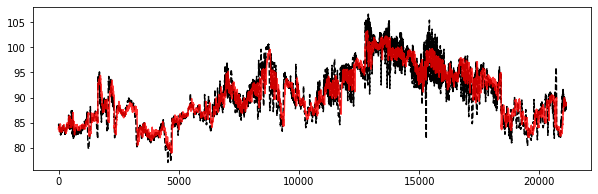

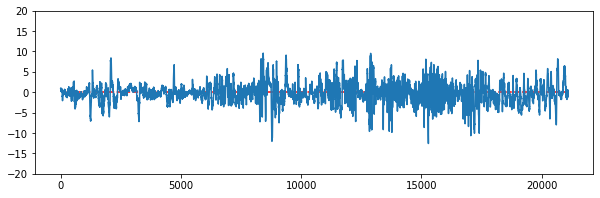

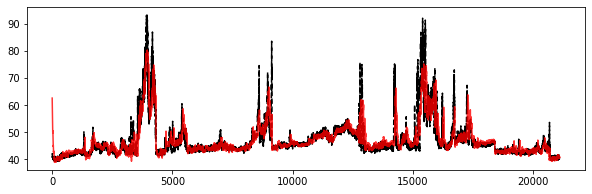

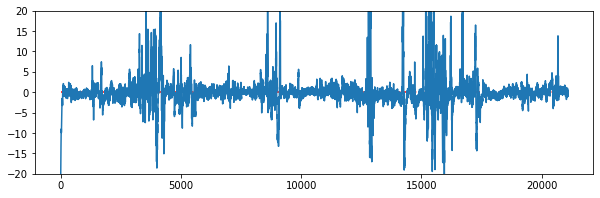

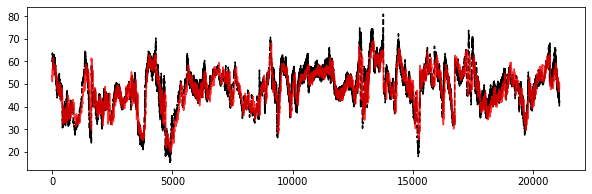

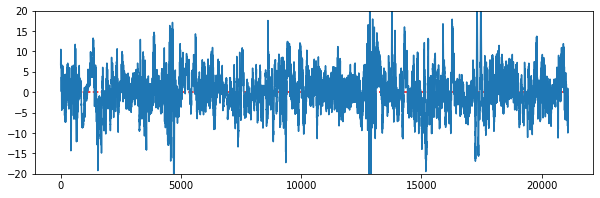

In [ ]:
data_target = Predict_AT
for var in range(Num_Sens):
    plt.figure(figsize = (10,3))
    plt.plot(Futr[:,-1,var], 'k--')
    plt.plot(data_target[:,-1,var], 'r',alpha = 0.8)

    plt.figure(figsize = (10,3))
    plt.plot(Futr[:,-1,var]-data_target[:,-1,var])
    plt.ylim([-20,20])
    plt.hlines(0, 0, Futr.shape[0], colors='red', linestyle='--')

##DA-S2S

In [29]:
Model_test_number = 4
Name_model_WAT = f"{Name_Data} TS {Test_Ratio_Plant} HISTORY {Len_Hist} FUTURE {Len_Futr}, DELTA {Delta} {Num_neurons}, {Model_test_number} WATT"

Update = False
if not FileExist(Path_Modeling, f"{Name_model_WAT}", 'model') or Update:
    time_start = time.time()

    Model_WAT = ATT_TC_LSTM(Hist_Train_wght_sc, Futr_Train_wght_sc, 1 ,Num_neurons, True)
    print(Model_WAT.summary())
    history = Model_WAT.fit(Hist_Train_wght_sc, Futr_Train_wght_sc,
                            epochs = 10000, callbacks=[Early_stopping_cb],
                            verbose = 2, batch_size=Size_batch,
                            validation_data=(Hist_Test_wght_sc, Futr_Test_wght_sc))
    Model_WAT.save(f'{Path_Modeling}/{Name_model_WAT}')

    time_end = time.time()
    Time_Training = time_end - time_start

    np.set_printoptions(precision=2)
    print(f"{Time_Training} secs were taken")
    CreateFolder(f"{Path_Modeling}/{Name_model_WAT}/{Time_Training} secs were taken")

else:
    Model_WAT = LoadFile(Path_Modeling, f'{Name_model_WAT}', 'model')

Hist_wght_sc = np.concatenate([Hist_Train_wght_sc, Hist_Test_wght_sc], axis=0)

Std_Sens = np.tile(Std_Proc[-3:], (Futr_Test_sc.shape[1],1))
Mean_Sens = np.tile(Mean_Proc[-3:], (Futr_Test_sc.shape[1],1))

Predict_WAT = Model_WAT.predict(Hist_wght_sc)*Std_Proc_wght[-3:] + Mean_Proc_wght[-3:]

Model is loaded from: /content/gdrive/My Drive/Colab Notebooks/DC/Modeling/BDO Data Operation October CLS 8 SRS 500 TS 0.2 HISTORY 80 FUTURE 50, DELTA 1.5 25, 4 WATT


In [ ]:
data_target = Predict_WAT/factor
for var in range(Num_Sens):
    for j in range(0,data_target.shape[0]-1000, 1000):
        plt.figure(figsize = (10,3))
        for i in range(j,j+1000, Len_Futr):
            plt.plot(np.arange(i, i+Len_Futr), Futr[i, :, var].flatten(), 'k')
            plt.plot(np.arange(i, i+Len_Futr), data_target[i, :, var].flatten(), 'r')
        plt.show()

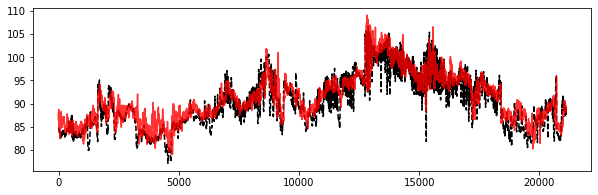

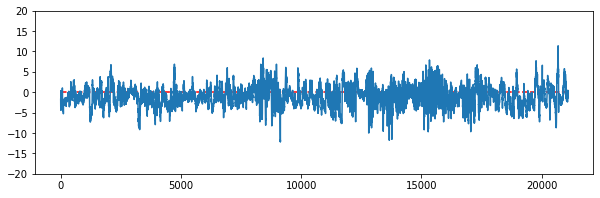

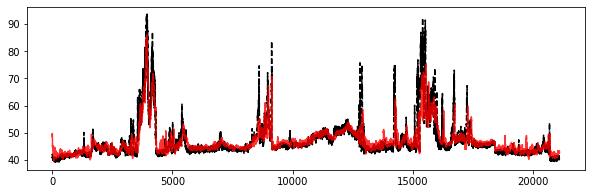

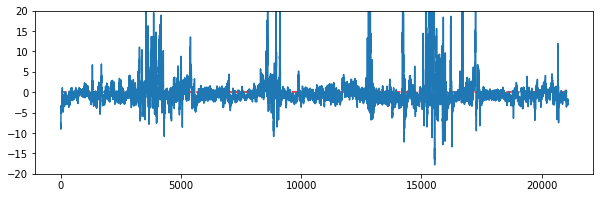

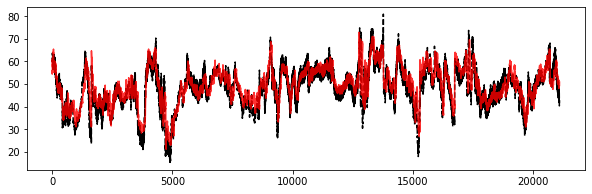

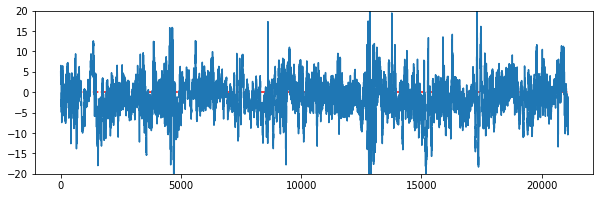

In [ ]:
data_target = Predict_WAT/factor
for var in range(Num_Sens):
    plt.figure(figsize = (10,3))
    plt.plot(Futr[:,-1,var], 'k--')
    plt.plot(data_target[:,-1,var], 'r',alpha = 0.8)

    plt.figure(figsize = (10,3))
    plt.plot(Futr[:,-1,var]-data_target[:,-1,var])
    plt.hlines(0, 0, Futr.shape[0], colors='red', linestyle='--')
    plt.ylim([-20,20])

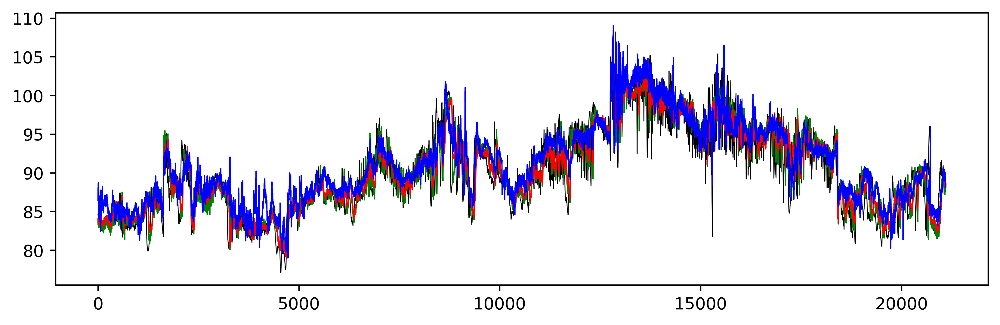

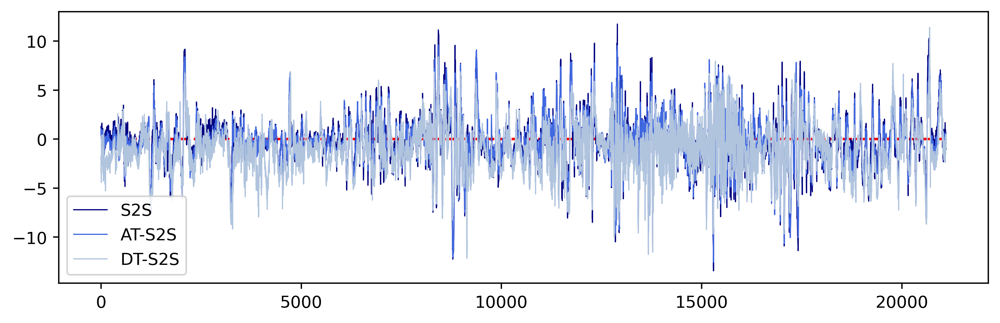

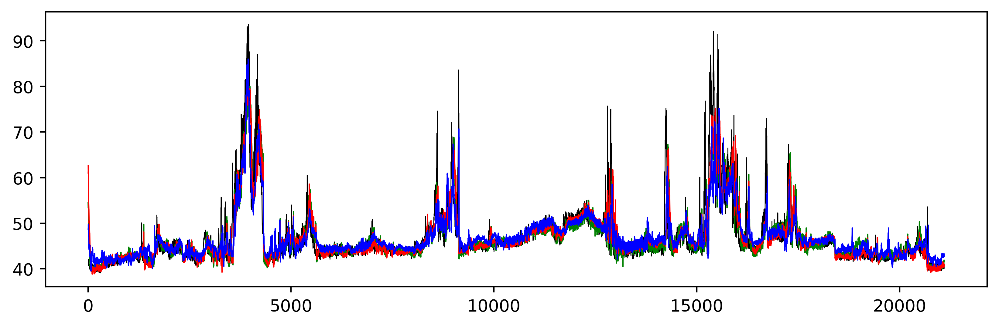

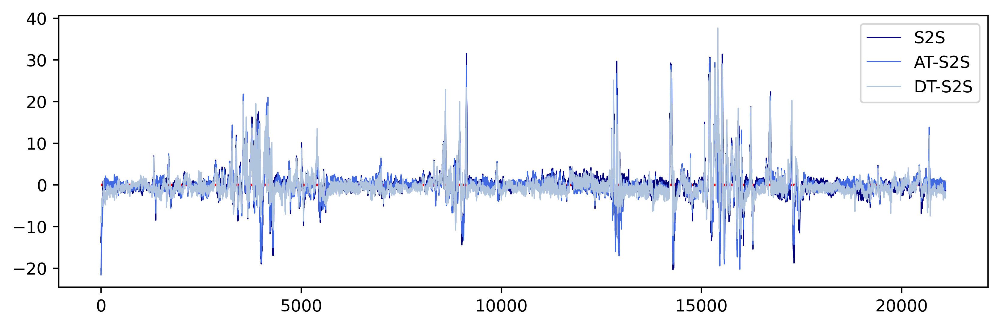

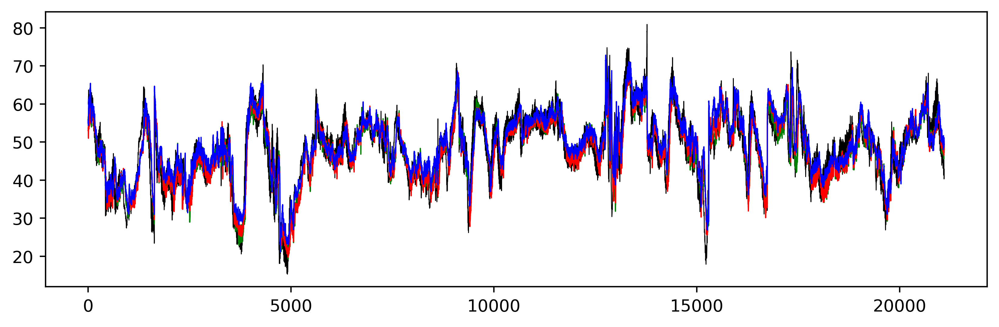

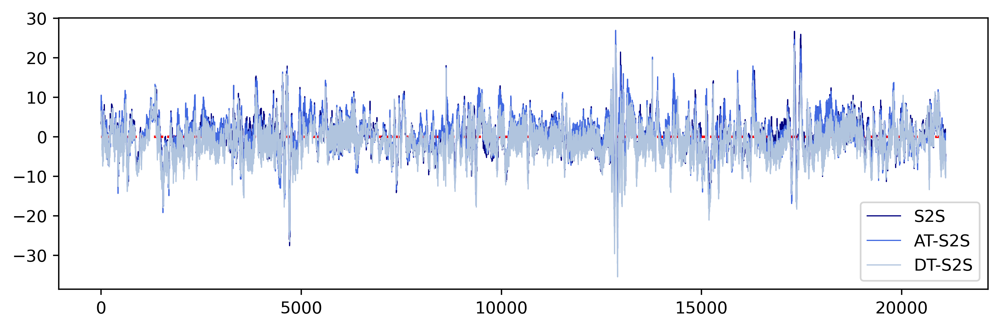

In [ ]:
data_target = Predict_WAT/factor
for var in range(Num_Sens):
    plt.figure(figsize = (10,3), dpi=400)
    plt.plot(Futr[:,-1,var], 'k-', linewidth = 0.5)
    plt.plot(Predict_DW[:,-1,var], color = 'g', linewidth = 0.7)
    plt.plot(Predict_AT[:,-1,var], color = 'r', linewidth = 0.7)
    plt.plot(data_target[:,-1,var], color = 'b', linewidth = 0.7)

    plt.figure(figsize = (10,3), dpi=400)
    plt.plot(Futr[:,-1,var]-Predict_DW[:,-1,var], color = 'navy', linewidth = 0.7)
    plt.plot(Futr[:,-1,var]-Predict_AT[:,-1,var], color = 'royalblue', linewidth = 0.7)
    plt.plot(Futr[:,-1,var]-data_target[:,-1,var], color = 'lightsteelblue', linewidth = 0.7)
    plt.legend(['S2S', 'AT-S2S', 'DT-S2S'])

    plt.hlines(0, 0, Futr.shape[0], colors='red', linestyle='--')

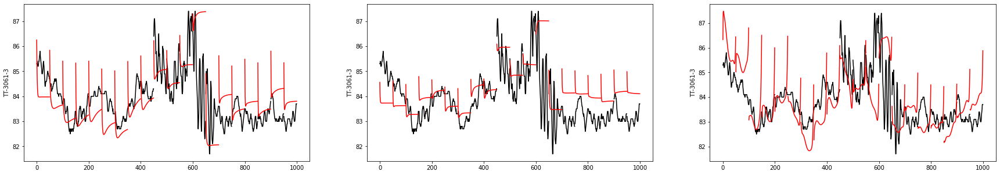

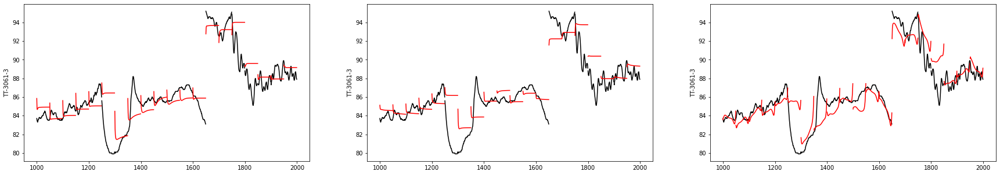

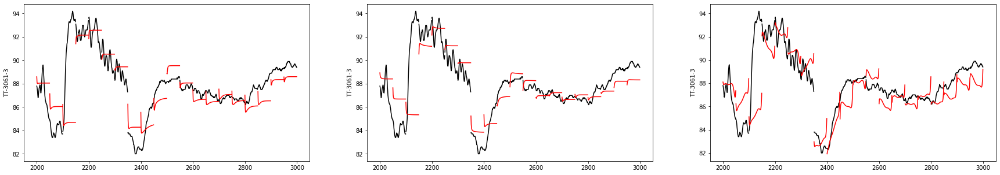

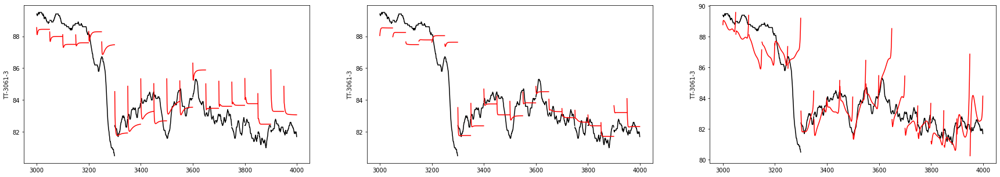

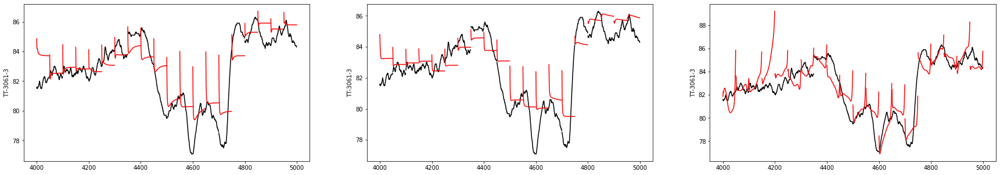

...

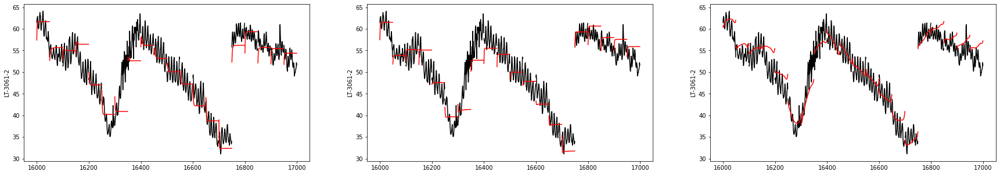

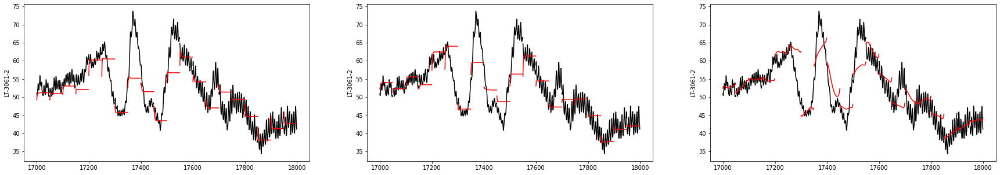

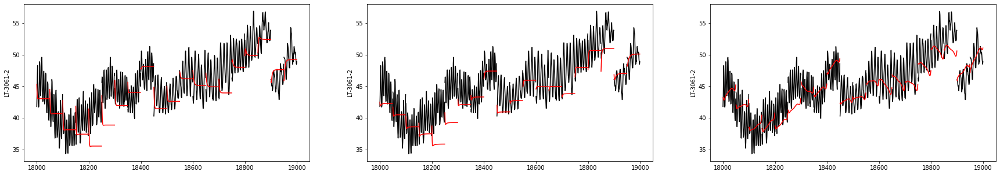

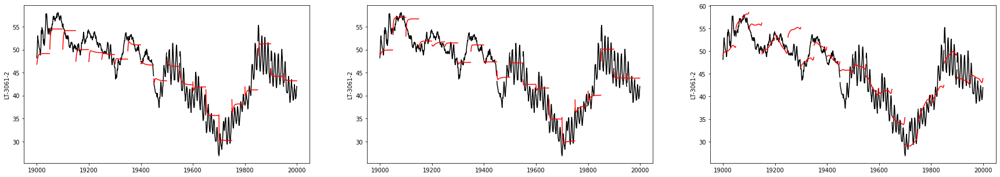

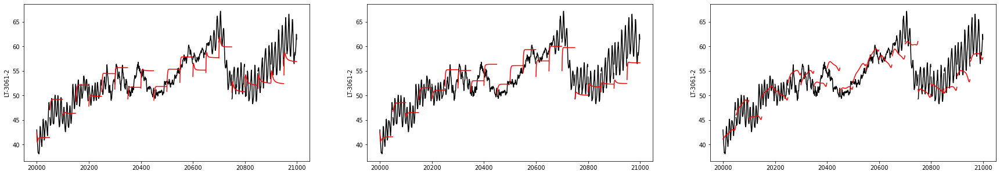

In [30]:
data_target = Predict_WAT/factor

for var in range(Num_Sens):
    for j in range(0,data_target.shape[0]-1000, 1000):

        fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (30,5))
        for i in range(j,j+1000, Len_Futr):

            ax1.plot(np.arange(i, i+Len_Futr), Futr[i, :, var].flatten(), 'k')
            ax1.plot(np.arange(i, i+Len_Futr), Predict_DW[i, :, var].flatten(), 'r')
            ax1.set_ylabel(f'{Var_Sens[var]}')

            ax2.plot(np.arange(i, i+Len_Futr), Futr[i, :, var].flatten(), 'k')
            ax2.plot(np.arange(i, i+Len_Futr), Predict_AT[i, :, var].flatten(), 'r')
            ax2.set_ylabel(f'{Var_Sens[var]}')

            ax3.plot(np.arange(i, i+Len_Futr), Futr[i, :, var].flatten(), 'k')
            ax3.plot(np.arange(i, i+Len_Futr), data_target[i, :, var].flatten(), 'r')
            ax3.set_ylabel(f'{Var_Sens[var]}')

        plt.show()